Import audio stream

In [18]:
!jupyter nbextension enable --py ipywidgets

Traceback (most recent call last):
  File "C:\Users\user\miniconda3\Scripts\jupyter-nbextension-script.py", line 10, in <module>
    sys.exit(main())
  File "C:\Users\user\miniconda3\lib\site-packages\jupyter_core\application.py", line 277, in launch_instance
    return super().launch_instance(argv=argv, **kwargs)
  File "C:\Users\user\miniconda3\lib\site-packages\traitlets\config\application.py", line 992, in launch_instance
    app.start()
  File "C:\Users\user\miniconda3\lib\site-packages\notebook\nbextensions.py", line 972, in start
    super().start()
  File "C:\Users\user\miniconda3\lib\site-packages\jupyter_core\application.py", line 266, in start
    self.subapp.start()
  File "C:\Users\user\miniconda3\lib\site-packages\notebook\nbextensions.py", line 882, in start
    self.toggle_nbextension_python(self.extra_args[0])
  File "C:\Users\user\miniconda3\lib\site-packages\notebook\nbextensions.py", line 855, in toggle_nbextension_python
    return toggle(module,
  File "C:\Users\u

In [2]:
!pip install ruptures
!pip install soundfile
!pip install sounddevice

     -------------------------------------- 381.3/381.3 kB 7.9 MB/s eta 0:00:00
     ---------------------------------------- 1.0/1.0 MB 31.2 MB/s eta 0:00:00
     ------------------------------------- 199.7/199.7 kB 11.8 MB/s eta 0:00:00


In [4]:
!pip install "tensorflow >2.2.0"

In [1]:
import tensorflow as tf
from tensorflow import keras
import scipy
import scipy.io.wavfile as wav
import numpy as np
import wave
import matplotlib.pyplot as plt
import noisereduce
import speechpy
import os
from scipy.cluster.vq import vq, kmeans2, kmeans, whiten
from scipy.spatial import distance
from tqdm.notebook import tqdm
from hmmlearn import hmm
import ruptures as rpt
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import soundfile as sf
import sounddevice as sd
import pickle 

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

# Import Arphabet readings

In [3]:
# working_dir_path = '/content/drive/MyDrive/UCLA Corpus'
working_dir_path = os.getcwd()
working_dir_path = os.path.join(working_dir_path, '.\\UCLA Corpus')
ipa_set_filename = 'sloan-ipa.txt'

ipa_set_path = os.path.join(working_dir_path, ipa_set_filename)
print(ipa_set_path)

C:\Users\user\Documents\GitHub\automated-visual-acuity-tester\speech-model\.\UCLA Corpus\sloan-ipa.txt


In [4]:
sloan_letters = ['C', 'D', 'H', 'K', 'O', 'R', 'S', 'V', 'Z']

sloan_ipa_lookup = {}
for letter in sloan_letters:
    sloan_ipa_lookup[letter] = []
    
ipa_sloan_lookup = {}

ipa_set = set()

f = open(ipa_set_path, encoding='utf-8')
current_line = f.readline()
while current_line != '':
    if current_line[0] == ';':
        current_line = f.readline()
        continue
    sloan_ipa_lookup[current_line[0]].append(current_line[2:-1])
    ipa_sloan_lookup[current_line[2:-1]] = current_line[0]
    
    for character in current_line[2:-1].split(' '):
        if character != '':
            ipa_set.add(character)
    current_line = f.readline()
print("sloan_arpabet_lookup : \n" + str(sloan_ipa_lookup) + "\n")
print("arpabet_sloan_lookup  : \n" + str(ipa_sloan_lookup) + "\n")
print("ipa_set  : \n" + str(ipa_set) + "\n")

sloan_arpabet_lookup : 
{'C': ['s i'], 'D': ['d i'], 'H': ['eɪ tʃ', 'h eɪ tʃ'], 'K': ['k eɪ'], 'O': ['oʊ'], 'R': ['ɑ ɹ\t'], 'S': ['ɛ s'], 'V': ['v i'], 'Z': ['z i', 'z æ d', 'z ɛ ']}

arpabet_sloan_lookup  : 
{'s i': 'C', 'd i': 'D', 'eɪ tʃ': 'H', 'h eɪ tʃ': 'H', 'k eɪ': 'K', 'oʊ': 'O', 'ɑ ɹ\t': 'R', 'ɛ s': 'S', 'v i': 'V', 'z i': 'Z', 'z æ d': 'Z', 'z ɛ ': 'Z'}

ipa_set  : 
{'d', 'tʃ', 'eɪ', 'h', 'oʊ', 'k', 'æ', 'ɹ\t', 'ɛ', 'i', 'v', 'z', 's', 'ɑ'}



In [11]:
AUDIO_FORMAT = '.wav'

audio_path = os.path.join(working_dir_path, '.\\data')
# audio_path = '/content/drive/MyDrive/output.wav'
sloan_audio_list = []
folders = os.listdir(audio_path)
for folder in folders:
    dir_path = os.path.join(audio_path, folder)
    f = open(os.path.join(dir_path, 'text'), encoding='utf-8')
    
    strings = f.readlines()
    for line in strings:
        line_list = line[:-1].split(' ')
        audio_file_name = line_list[0]
        transcribed_ipa = line_list[1:]
        
        contains_sloan_ipa = False
        for character in ipa_set:
            if character in ''.join(transcribed_ipa):
                contains_sloan_ipa = True
        if contains_sloan_ipa:
            sloan_audio_list.append((audio_file_name + AUDIO_FORMAT, transcribed_ipa))

print(sloan_audio_list)
# print(folders)
# fs, signal = wav.read(audio_path)
# signal = signal[:,0]
# # wav_obj = wave.open(audio_path, 'rb')



[('abk-002-011.wav', ['ä', 'd', 'ä', 't̠ʃʰ', 'ä', 'r', 'ä']), ('abk-002-023.wav', ['ä', 'kʼ', 'ä', 'ʒ', 'ä', 'r', 'ä']), ('abk-002-035.wav', ['ä', 'ä', 'ä', 'd', 'ä']), ('abk-002-038.wav', ['d', 'ä', 'ä', 'ä']), ('abk-002-067.wav', ['ä', 'ʁ', 'd', 'ä', 'r', 'ä']), ('abk-002-105.wav', ['ä', 'd', 'χʷ', 'ä']), ('ace-000-000.wav', ['p', 'a', 'd', 'j', 'a', 'n']), ('ace-000-001.wav', ['p', 'a', 'd', 'j', 'o', 'h']), ('ace-000-002.wav', ['s', 'a', 'm', 'p', 'o', 'h']), ('ace-000-003.wav', ['l', 'e', 'u', 'h', 'o', 'p']), ('ace-000-004.wav', ['b', 'a', 't', 'e', 'i']), ('ace-000-007.wav', ['t', 'a', 'k', 'o', 't']), ('ace-000-011.wav', ['d', 'a', 'd', 'a']), ('ace-000-012.wav', ['d', 'a', 'j', 'a']), ('ace-000-013.wav', ['a', 'l', 'e', 'u', 'h', 'a', 't']), ('ace-000-014.wav', ['k', 'a', 'm', 'a']), ('ace-000-025.wav', ['b', 'a', 'ɡ', 'a', 'h']), ('ace-000-026.wav', ['s', 'a', 'b', 'o', 'h']), ('ace-000-027.wav', ['b', 'a', 's', 'a', 'h']), ('ace-000-028.wav', ['p', 'e', '

# Individual audio file segmenting using k-mean clustering
Segmenting individual audio files based on transcribed phonemes. Each audio files are normalized, fed to extract their MFCC at each time sample and compute cluster's centroids using k-mean clustering with the number of centroids equal to the number of unique phonemes + 1 (representing non-speech segments).

[ -17   -3   20 ... -280 -235 -233]
['ä', 'd', 'ä', 't̠ʃʰ', 'ä', 'r', 'ä']
130 58212 882 441.0
power spectrum shape= (130, 257)
mfcc(mean + variance normalized) feature shape= (130, 13)
['t̠ʃʰ', 'd', 'r', 'ä']
5
58212 44100


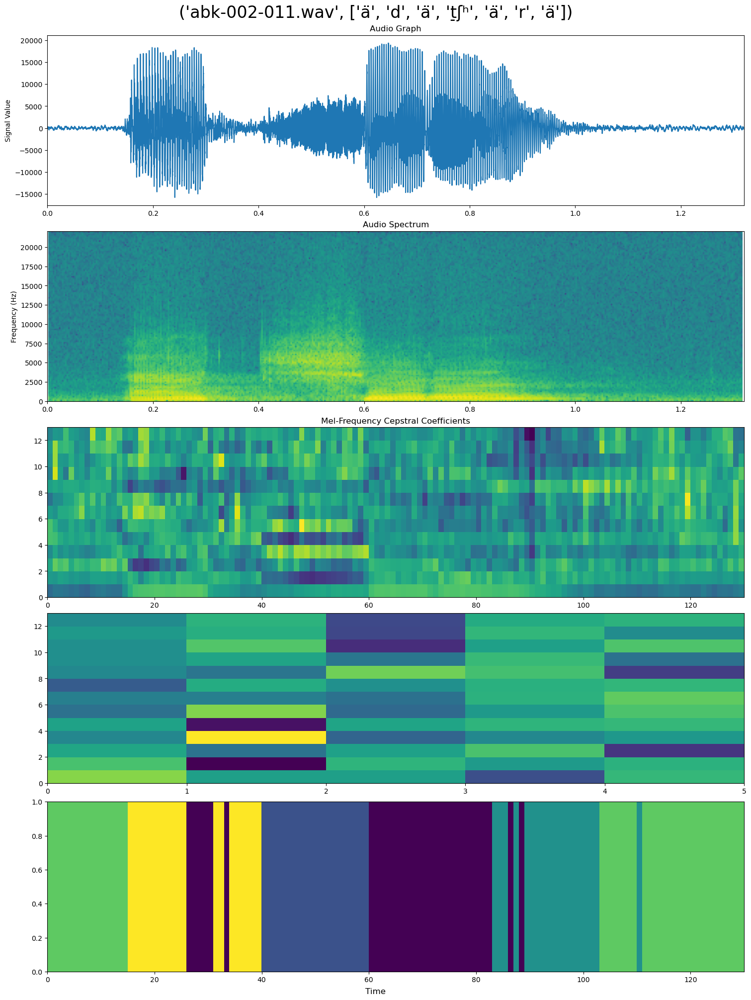

In [12]:
for sloan_sample in sloan_audio_list[:1]:
    audio_folder_path = os.path.join(audio_path, os.path.join(sloan_sample[0][:3], '.\\audio'))
    sample_audio_path = os.path.join(audio_folder_path, sloan_sample[0])
    fs, signal = wav.read(sample_audio_path)
    print(signal)
    print(sloan_sample[1])
    
    unique_ipa_list = list(set(sloan_sample[1]))
    
#     signal = signal[:,0]
    wav_obj = wave.open(sample_audio_path, 'rb')
    
    # Example of pre-emphasizing.
    signal_preemphasized = speechpy.processing.preemphasis(signal, cof=0.98)

    # Example of staching frames
    frames = speechpy.processing.stack_frames(signal, sampling_frequency=fs, frame_length=0.020, frame_stride=0.01, filter=lambda x: np.ones((x,)),
             zero_padding=True)

    # Example of extracting power spectrum
    power_spectrum = speechpy.processing.power_spectrum(frames, fft_points=512)
    print('power spectrum shape=', power_spectrum.shape)
    
    ############# Extract MFCC features #############
    mfcc = speechpy.feature.mfcc(signal, sampling_frequency=fs, frame_length=0.020, frame_stride=0.01,
                 num_filters=40, fft_length=512, low_frequency=0, high_frequency=None)
    mfcc_cmvn = speechpy.processing.cmvnw(mfcc,win_size=301,variance_normalization=True)
    print('mfcc(mean + variance normalized) feature shape=', mfcc_cmvn.shape)
    
    print(unique_ipa_list)
    whitened_mfcc_cmvn = whiten(mfcc_cmvn)
    codebook, distortion = kmeans(whitened_mfcc_cmvn,len(unique_ipa_list) + 1)
    print(len(codebook))
    
    classified_audio = []
    for sample in whitened_mfcc_cmvn:
        min_dist = float('inf')
        min_dist_idx = -1
        for i, centroid in enumerate(codebook):
            dist = distance.euclidean(sample, centroid)
            if dist < min_dist:
                min_dist = dist
                min_dist_idx = i
        classified_audio.append([min_dist_idx])
            
    
    sample_freq = wav_obj.getframerate()
    n_samples = wav_obj.getnframes()
    print(n_samples, sample_freq)
    t_audio = n_samples/sample_freq
    n_channels = wav_obj.getnchannels()
    signal_wave = wav_obj.readframes(n_samples)
    
    signal_array = np.frombuffer(signal_wave, dtype=np.int16)
    # l_channel = signal_array[0::2]
    # r_channel = signal_array[1::2]
    l_channel = signal_array
    times = np.linspace(0, n_samples/sample_freq, num=n_samples)
    
    fig, ax = plt.subplots(nrows=5, ncols=1, constrained_layout=True)
    fig.supxlabel('Time')
    fig.set_size_inches(15, 20)
    
    fig.suptitle(str(sloan_sample), fontsize=24)
    ax[0].plot(times, l_channel)
    ax[0].set_title('Audio Graph')
    ax[0].set_ylabel('Signal Value')
#     ax[0].set_xlabel('Time (s)')
    ax[0].set_xlim(0, t_audio)
    
    ax[1].specgram(l_channel, Fs=sample_freq)
    ax[1].set_title('Audio Spectrum')
    ax[1].set_ylabel('Frequency (Hz)')
#     ax[1].set_xlabel('Time (s)')
    ax[1].set_xlim(0, t_audio)
#     plt.colorbar(fig,ax=ax[0])

#     plt.figure(figsize=(15, 5))
    ax[2].set_title('Mel-Frequency Cepstral Coefficients')
    ax[2].pcolor(whitened_mfcc_cmvn.T)
    
    ax[3].pcolor(codebook.T)
    
    ax[4].pcolor(np.array(classified_audio).T)
#     break

# Audio file segmenting using entire dataset through k-mean clustering
In this approach, all the audio files are compiled into a single long array and converted into MFCC and used to segment the audio into 15 clusters (the total number of phonemes within the dataset plus one for non-speech segments) using k-mean clustering.

In [13]:
joined_whitened_mfcc = np.empty(shape=[0, 13])
for i, sloan_sample in enumerate(tqdm(sloan_audio_list)):
    audio_folder_path = os.path.join(audio_path, os.path.join(sloan_sample[0][:3], '.\\audio'))
    sample_audio_path = os.path.join(audio_folder_path, sloan_sample[0])
    fs, signal = wav.read(sample_audio_path)
    
    wav_obj = wave.open(sample_audio_path, 'rb')
    
    # Example of pre-emphasizing.
    signal_preemphasized = speechpy.processing.preemphasis(signal, cof=0.98)

    # Example of staching frames
    frames = speechpy.processing.stack_frames(signal, sampling_frequency=fs, frame_length=0.020, frame_stride=0.01, filter=lambda x: np.ones((x,)),
             zero_padding=True)

    # Example of extracting power spectrum
    power_spectrum = speechpy.processing.power_spectrum(frames, fft_points=512)
#     print('power spectrum shape=', power_spectrum.shape)
    
    ############# Extract MFCC features #############
    mfcc = speechpy.feature.mfcc(signal, sampling_frequency=fs, frame_length=0.020, frame_stride=0.01,
                 num_filters=40, fft_length=512, low_frequency=0, high_frequency=None)
    mfcc_cmvn = np.array(speechpy.processing.cmvnw(mfcc,win_size=301,variance_normalization=True))
    whitened_mfcc_cmvn = np.array(whiten(mfcc_cmvn))
    joined_whitened_mfcc = np.concatenate((joined_whitened_mfcc, whitened_mfcc_cmvn), axis=0)
joined_whitened_mfcc = np.array(joined_whitened_mfcc)

  0%|          | 0/3581 [00:00<?, ?it/s]

130 58212 882 441.0
133 59535 882 441.0
121 54243 882 441.0
106 47628 882 441.0
118 52920 882 441.0
106 47628 882 441.0
121 54242 882 441.0
100 44982 882 441.0
103 46305 882 441.0
103 46305 882 441.0
118 52919 882 441.0
100 44982 882 441.0
127 56889 882 441.0
121 54243 882 441.0
106 47628 882 441.0
106 47628 882 441.0
113 50275 882 441.0
100 44982 882 441.0
110 48952 882 441.0
100 44982 882 441.0
88 39690 882 441.0
115 51597 882 441.0
103 46305 882 441.0
109 48951 882 441.0
106 47628 882 441.0
113 50275 882 441.0
100 44982 882 441.0
103 46305 882 441.0
148 66149 882 441.0
115 51597 882 441.0
146 64828 882 441.0
146 64828 882 441.0
125 55567 882 441.0
97 43659 882 441.0
124 55566 882 441.0
118 52920 882 441.0
109 48951 882 441.0
151 67473 882 441.0
145 64827 882 441.0
157 70119 882 441.0
298 132300 882 441.0
94 42336 882 441.0
235 104517 882 441.0
166 74088 882 441.0
91 41013 882 441.0
115 51597 882 441.0
100 44982 882 441.0
94 42336 882 441.0
127 56889 882 441.0
121 54243 882 441.0
118

115 51597 882 441.0
97 43659 882 441.0
109 48951 882 441.0
118 52920 882 441.0
103 46305 882 441.0
88 39690 882 441.0
94 42336 882 441.0
97 43659 882 441.0
112 50274 882 441.0
91 41013 882 441.0
97 43659 882 441.0
100 44982 882 441.0
106 47628 882 441.0
100 44982 882 441.0
100 44982 882 441.0
103 46305 882 441.0
133 59535 882 441.0
112 50274 882 441.0
112 50274 882 441.0
106 47628 882 441.0
94 42336 882 441.0
88 39690 882 441.0
91 41012 882 441.0
88 39690 882 441.0
91 41012 882 441.0
97 43659 882 441.0
97 43659 882 441.0
94 42336 882 441.0
85 38367 882 441.0
115 51597 882 441.0
97 43659 882 441.0
103 46305 882 441.0
98 43660 882 441.0
82 37044 882 441.0
112 50274 882 441.0
86 38368 882 441.0
98 43660 882 441.0
83 37045 882 441.0
79 35721 882 441.0
104 46306 882 441.0
98 43660 882 441.0
103 46305 882 441.0
95 42337 882 441.0
106 47628 882 441.0
118 52920 882 441.0
106 47628 882 441.0
94 42336 882 441.0
106 47628 882 441.0
118 52920 882 441.0
121 54243 882 441.0
109 48951 882 441.0
103 4

88 39690 882 441.0
85 38367 882 441.0
82 37044 882 441.0
91 41013 882 441.0
76 34398 882 441.0
61 27783 882 441.0
76 34398 882 441.0
82 37044 882 441.0
76 34398 882 441.0
67 30429 882 441.0
83 37045 882 441.0
70 31752 882 441.0
88 39690 882 441.0
97 43659 882 441.0
109 48951 882 441.0
136 60858 882 441.0
107 47629 882 441.0
91 41013 882 441.0
74 33076 882 441.0
77 34399 882 441.0
91 41013 882 441.0
104 46306 882 441.0
74 33076 882 441.0
88 39690 882 441.0
94 42336 882 441.0
133 59535 882 441.0
100 44982 882 441.0
68 30430 882 441.0
82 37044 882 441.0
128 56890 882 441.0
121 54243 882 441.0
88 39690 882 441.0
196 87318 882 441.0
127 56889 882 441.0
115 51597 882 441.0
92 41014 882 441.0
125 55567 882 441.0
79 35721 882 441.0
88 39690 882 441.0
92 41014 882 441.0
85 38367 882 441.0
112 50274 882 441.0
73 33075 882 441.0
100 44982 882 441.0
92 41014 882 441.0
91 41013 882 441.0
91 41013 882 441.0
85 38367 882 441.0
112 50274 882 441.0
139 62181 882 441.0
76 34398 882 441.0
70 31752 882 44

109 48951 882 441.0
115 51597 882 441.0
103 46305 882 441.0
94 42336 882 441.0
100 44982 882 441.0
109 48951 882 441.0
91 41013 882 441.0
91 41013 882 441.0
100 44982 882 441.0
106 47627 882 441.0
112 50274 882 441.0
121 54243 882 441.0
121 54243 882 441.0
121 54243 882 441.0
115 51597 882 441.0
118 52920 882 441.0
109 48951 882 441.0
100 44982 882 441.0
97 43659 882 441.0
112 50274 882 441.0
121 54243 882 441.0
94 42336 882 441.0
103 46305 882 441.0
91 41013 882 441.0
106 47628 882 441.0
148 66150 882 441.0
128 56890 882 441.0
106 47628 882 441.0
94 42336 882 441.0
112 50274 882 441.0
113 50275 882 441.0
94 42336 882 441.0
85 38367 882 441.0
103 46305 882 441.0
97 43659 882 441.0
79 35721 882 441.0
88 39690 882 441.0
97 43659 882 441.0
106 47628 882 441.0
115 51597 882 441.0
112 50274 882 441.0
137 60859 882 441.0
88 39690 882 441.0
91 41013 882 441.0
91 41013 882 441.0
143 63505 882 441.0
79 35721 882 441.0
106 47628 882 441.0
109 48951 882 441.0
82 37044 882 441.0
88 39690 882 441.0

88 39690 882 441.0
103 46305 882 441.0
100 44982 882 441.0
97 43659 882 441.0
100 44982 882 441.0
82 37044 882 441.0
103 46304 882 441.0
103 46305 882 441.0
100 44982 882 441.0
91 41013 882 441.0
86 38368 882 441.0
80 35722 882 441.0
127 56889 882 441.0
104 46306 882 441.0
89 39691 882 441.0
95 42337 882 441.0
85 38367 882 441.0
106 47628 882 441.0
79 35721 882 441.0
127 56889 882 441.0
112 50274 882 441.0
100 44982 882 441.0
101 44983 882 441.0
77 34399 882 441.0
89 39691 882 441.0
100 44982 882 441.0
100 44982 882 441.0
71 31753 882 441.0
107 47629 882 441.0
121 54243 882 441.0
112 50274 882 441.0
110 48952 882 441.0
100 44982 882 441.0
85 38367 882 441.0
85 38367 882 441.0
97 43659 882 441.0
94 42336 882 441.0
112 50273 882 441.0
106 47628 882 441.0
97 43659 882 441.0
100 44982 882 441.0
118 52920 882 441.0
142 63504 882 441.0
124 55566 882 441.0
101 44983 882 441.0
109 48951 882 441.0
98 43660 882 441.0
98 43660 882 441.0
95 42337 882 441.0
109 48951 882 441.0
121 54243 882 441.0
1

121 54242 882 441.0
109 48951 882 441.0
145 64827 882 441.0
130 58212 882 441.0
121 54243 882 441.0
103 46305 882 441.0
154 68796 882 441.0
115 51597 882 441.0
115 51597 882 441.0
121 54243 882 441.0
112 50274 882 441.0
124 55566 882 441.0
100 44982 882 441.0
133 59535 882 441.0
143 63505 882 441.0
103 46305 882 441.0
121 54243 882 441.0
85 38367 882 441.0
115 51597 882 441.0
107 47629 882 441.0
157 70119 882 441.0
161 71443 882 441.0
287 127009 882 441.0
128 56890 882 441.0
118 52920 882 441.0
107 47629 882 441.0
131 58213 882 441.0
121 54243 882 441.0
172 76734 882 441.0
169 75411 882 441.0
139 62181 882 441.0
178 79380 882 441.0
115 51597 882 441.0
143 63505 882 441.0
130 58212 882 441.0
121 54243 882 441.0
124 55566 882 441.0
139 62181 882 441.0
145 64827 882 441.0
112 50274 882 441.0
88 39690 882 441.0
76 34398 882 441.0
139 62181 882 441.0
112 50274 882 441.0
157 70119 882 441.0
151 67473 882 441.0
160 71442 882 441.0
169 75411 882 441.0
115 51597 882 441.0
106 47628 882 441.0
13

85 38367 882 441.0
118 52920 882 441.0
82 37044 882 441.0
97 43659 882 441.0
76 34398 882 441.0
91 41013 882 441.0
107 47629 882 441.0
94 42336 882 441.0
74 33076 882 441.0
83 37045 882 441.0
95 42337 882 441.0
97 43659 882 441.0
82 37044 882 441.0
91 41013 882 441.0
101 44983 882 441.0
88 39690 882 441.0
79 35721 882 441.0
82 37044 882 441.0
112 50274 882 441.0
91 41013 882 441.0
94 42336 882 441.0
107 47629 882 441.0
95 42337 882 441.0
88 39690 882 441.0
73 33075 882 441.0
85 38367 882 441.0
103 46305 882 441.0
97 43659 882 441.0
95 42337 882 441.0
76 34398 882 441.0
77 34399 882 441.0
79 35721 882 441.0
88 39690 882 441.0
91 41013 882 441.0
112 50274 882 441.0
100 44982 882 441.0
89 39691 882 441.0
88 39690 882 441.0
109 48951 882 441.0
88 39690 882 441.0
97 43659 882 441.0
83 37045 882 441.0
86 38368 882 441.0
85 38367 882 441.0
80 35722 882 441.0
88 39690 882 441.0
76 34398 882 441.0
76 34398 882 441.0
85 38366 882 441.0
106 47628 882 441.0
106 47628 882 441.0
112 50274 882 441.0


94 42336 882 441.0
109 48951 882 441.0
94 42336 882 441.0
115 51597 882 441.0
97 43658 882 441.0
91 41013 882 441.0
94 42336 882 441.0
82 37044 882 441.0
97 43659 882 441.0
103 46305 882 441.0
94 42336 882 441.0
97 43659 882 441.0
89 39691 882 441.0
103 46305 882 441.0
100 44982 882 441.0
95 42337 882 441.0
109 48951 882 441.0
107 47629 882 441.0
71 31753 882 441.0
95 42337 882 441.0
98 43660 882 441.0
85 38367 882 441.0
76 34398 882 441.0
80 35722 882 441.0
112 50274 882 441.0
97 43659 882 441.0
104 46306 882 441.0
103 46305 882 441.0
91 41013 882 441.0
83 37045 882 441.0
100 44982 882 441.0
104 46306 882 441.0
91 41013 882 441.0
79 35721 882 441.0
94 42336 882 441.0
85 38367 882 441.0
76 34398 882 441.0
115 51597 882 441.0
91 41013 882 441.0
94 42336 882 441.0
85 38367 882 441.0
94 42336 882 441.0
97 43659 882 441.0
97 43659 882 441.0
97 43659 882 441.0
82 37044 882 441.0
118 52920 882 441.0
94 42336 882 441.0
88 39690 882 441.0
103 46305 882 441.0
85 38367 882 441.0
79 35721 882 441

121 54243 882 441.0
124 55566 882 441.0
118 52920 882 441.0
163 72765 882 441.0
155 68797 882 441.0
164 72766 882 441.0
214 95256 882 441.0
170 75412 882 441.0
169 75411 882 441.0
163 72765 882 441.0
133 59535 882 441.0
121 54242 882 441.0
97 43659 882 441.0
119 52921 882 441.0
103 46305 882 441.0
106 47628 882 441.0
106 47628 882 441.0
130 58212 882 441.0
125 55567 882 441.0
125 55567 882 441.0
149 66151 882 441.0
118 52920 882 441.0
133 59535 882 441.0
130 58212 882 441.0
109 48951 882 441.0
127 56889 882 441.0
112 50274 882 441.0
127 56889 882 441.0
118 52920 882 441.0
115 51597 882 441.0
101 44983 882 441.0
104 46306 882 441.0
103 46305 882 441.0
85 38367 882 441.0
104 46306 882 441.0
104 46306 882 441.0
235 104517 882 441.0
86 38368 882 441.0
100 44982 882 441.0
94 42336 882 441.0
133 59535 882 441.0
106 47628 882 441.0
127 56888 882 441.0
112 50274 882 441.0
118 52920 882 441.0
103 46305 882 441.0
100 44982 882 441.0
79 35720 882 441.0
79 35721 882 441.0
97 43658 882 441.0
61 277

In [14]:
print(joined_whitened_mfcc)
centroid, label = kmeans2(joined_whitened_mfcc,len(ipa_set) + 1,)

[[-1.43879747 -0.06482415  0.34661004 ... -0.3458229  -0.08188183
  -0.68858212]
 [-1.0757637  -0.1318752   1.50010467 ...  2.1308322   2.1443696
  -0.10258707]
 [-1.09960234  0.1867867   1.07254124 ... -0.06272604  0.7465539
  -0.19962288]
 ...
 [-0.48366368  0.41203377  0.7114948  ...  0.099533    1.39046741
   2.08996868]
 [-0.59384656  0.59683514  0.96493506 ... -0.47014165  0.75415081
   0.59302831]
 [-0.57698959  0.21292982 -0.07941874 ... -0.09555658  1.07443118
   1.60076892]]


[ 0 12  0 ...  5 10  2]


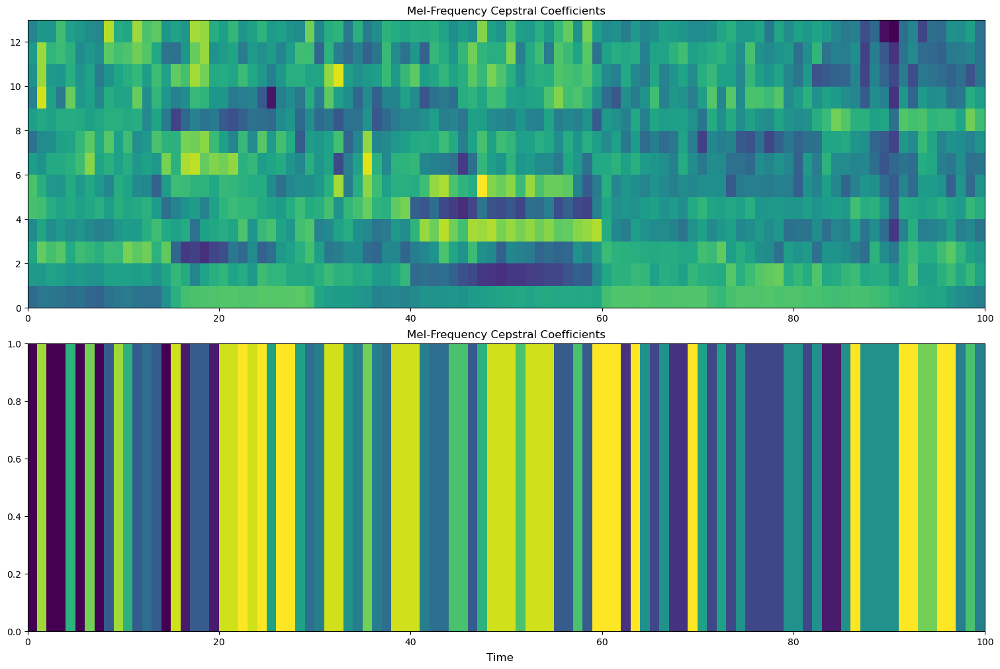

In [15]:
print(label)
fig, ax = plt.subplots(nrows=2, ncols=1, constrained_layout=True)
fig.supxlabel('Time')
fig.set_size_inches(15, 10)

ax[0].set_title('Mel-Frequency Cepstral Coefficients')
ax[0].pcolor(joined_whitened_mfcc[:100].T)

ax[1].set_title('Mel-Frequency Cepstral Coefficients')
ax[1].pcolor(np.array([[x] for x in label[:100]]).T)

[ -17   -3   20 ... -280 -235 -233]
['ä', 'd', 'ä', 't̠ʃʰ', 'ä', 'r', 'ä']
130 58212 882 441.0
power spectrum shape= (130, 257)
mfcc(mean + variance normalized) feature shape= (130, 13)
58212 44100
[ 358  436  468 ... -348 -373 -382]
['ä', 'kʼ', 'ä', 'ʒ', 'ä', 'r', 'ä']
133 59535 882 441.0
power spectrum shape= (133, 257)
mfcc(mean + variance normalized) feature shape= (133, 13)
59535 44100
[1216 1233 1299 ... 2212 2361 2503]
['ä', 'ä', 'ä', 'd', 'ä']
121 54243 882 441.0
power spectrum shape= (121, 257)
mfcc(mean + variance normalized) feature shape= (121, 13)
54243 44100
[-315 -336 -297 ... -111 -111 -138]
['d', 'ä', 'ä', 'ä']
106 47628 882 441.0
power spectrum shape= (106, 257)
mfcc(mean + variance normalized) feature shape= (106, 13)
47628 44100
[-193 -175 -182 ...   33   71   22]
['ä', 'ʁ', 'd', 'ä', 'r', 'ä']
118 52920 882 441.0
power spectrum shape= (118, 257)
mfcc(mean + variance normalized) feature shape= (118, 13)
52920 44100
[-394 -439 -371 ... -480 -478 -51

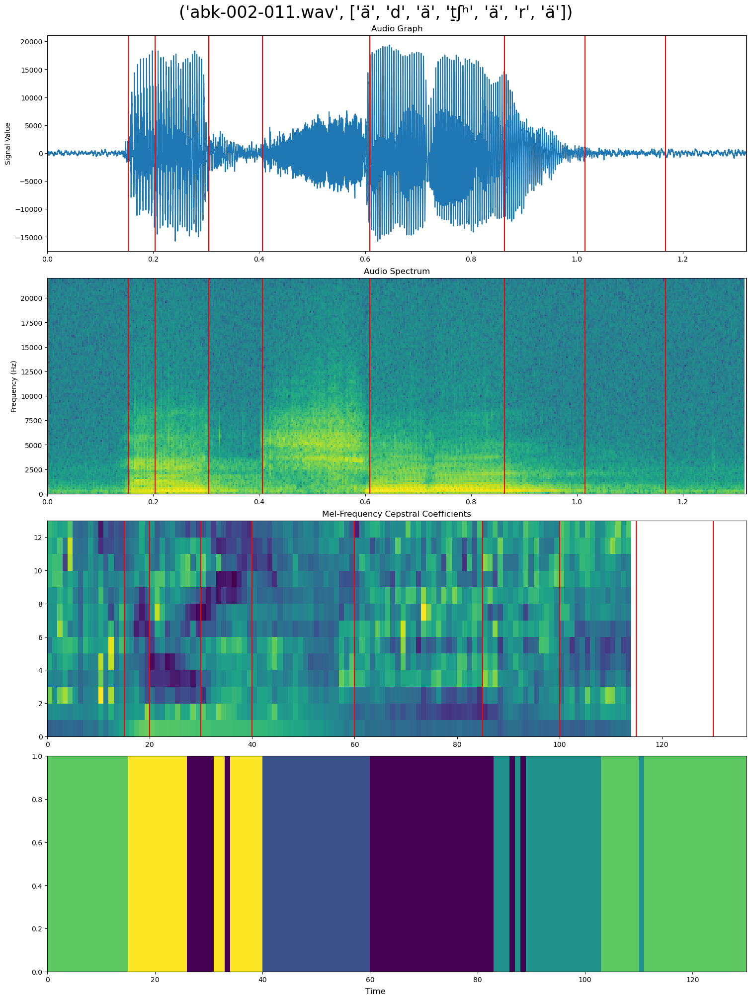

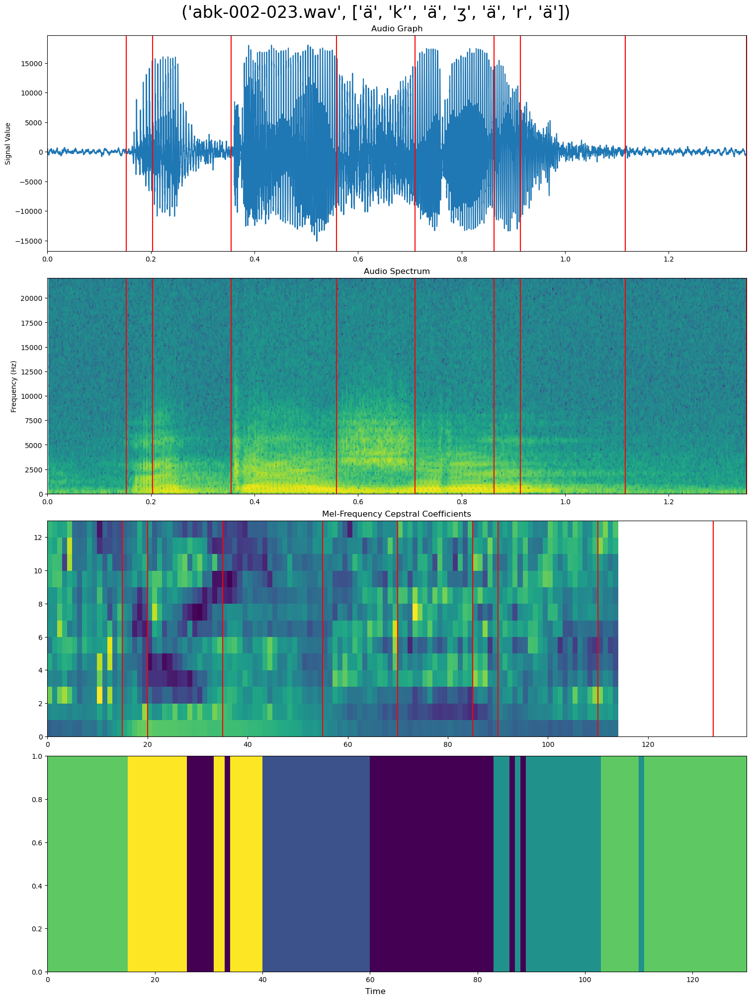

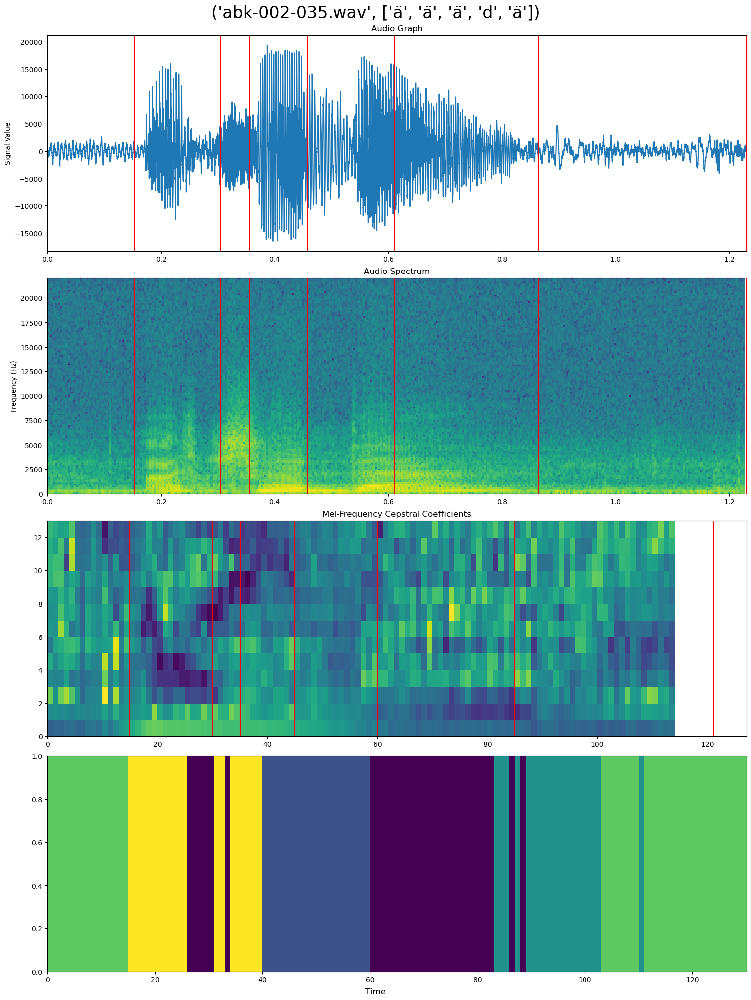

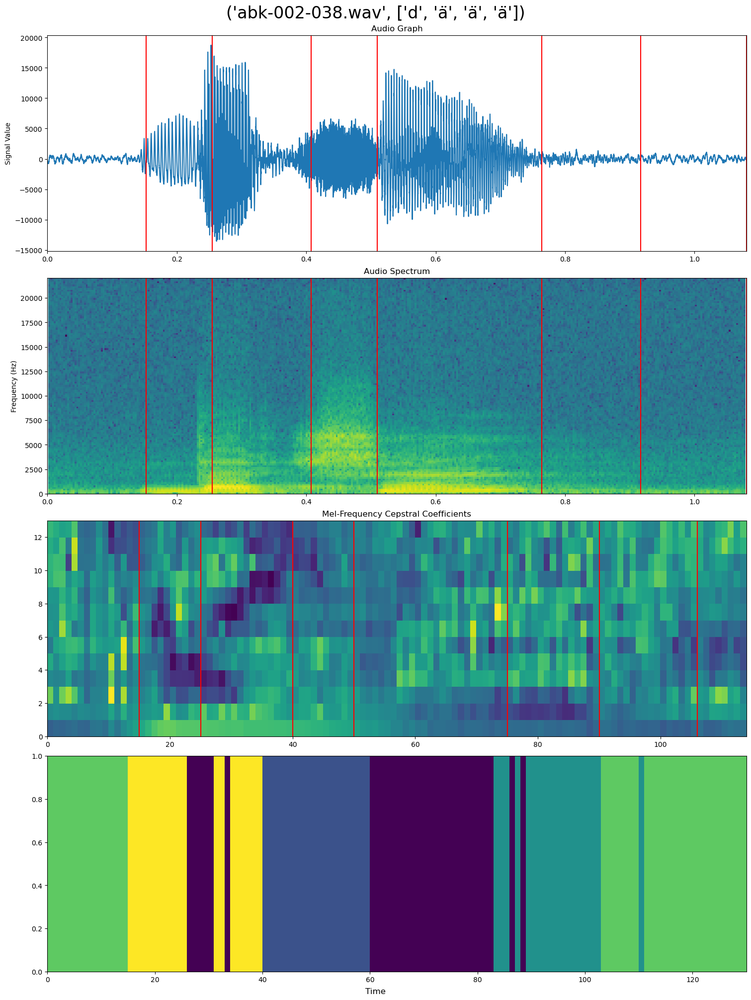

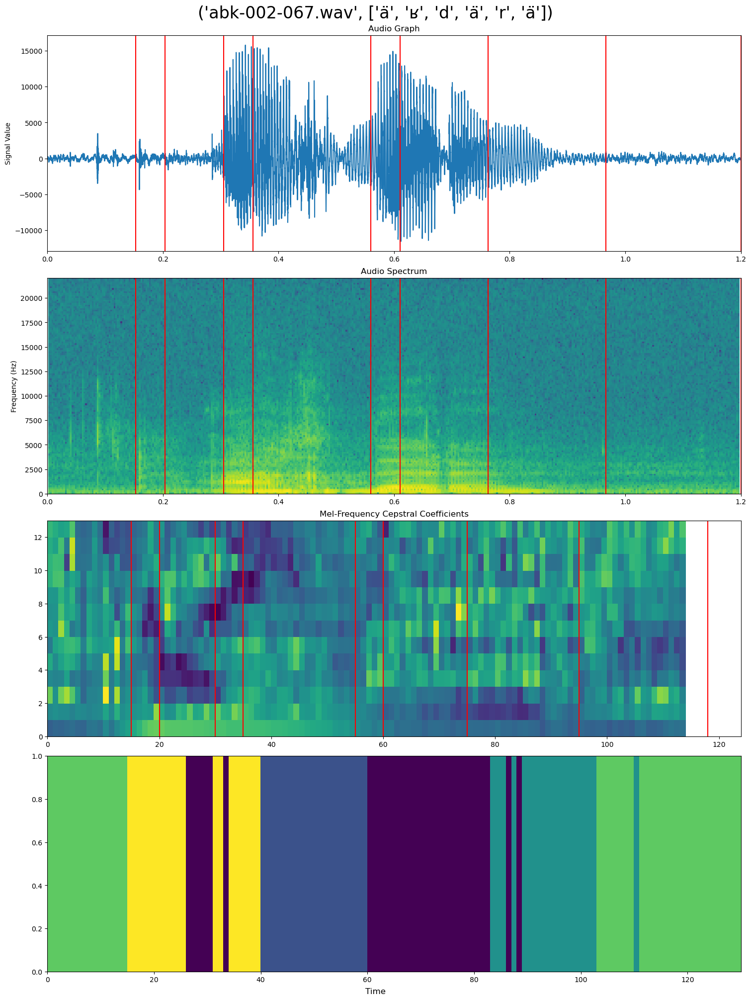

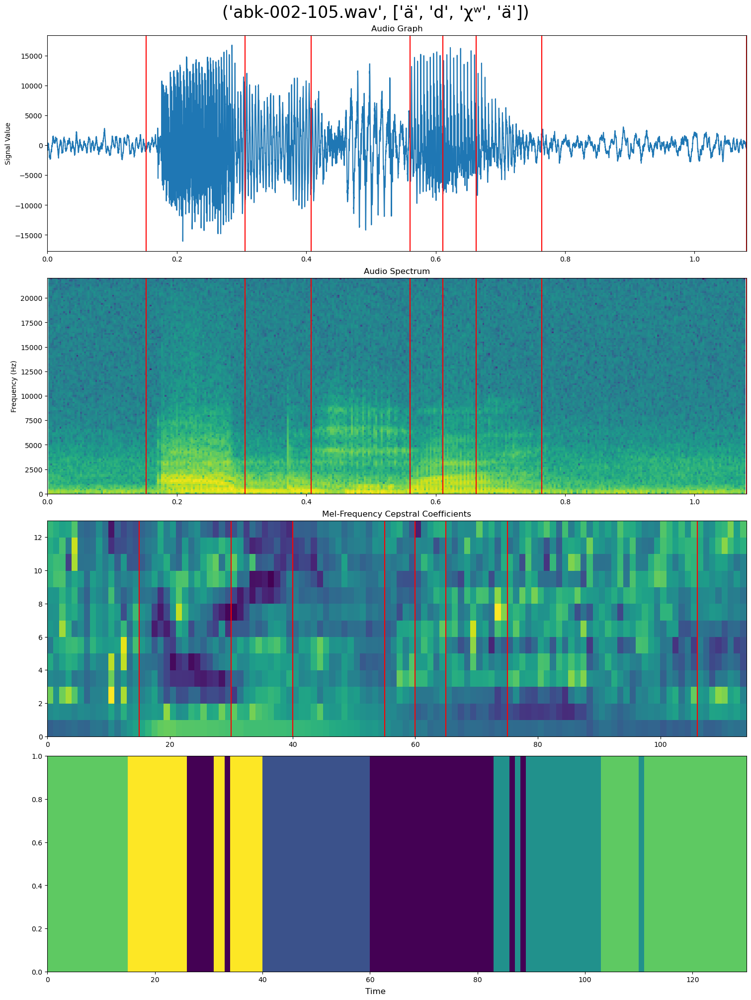

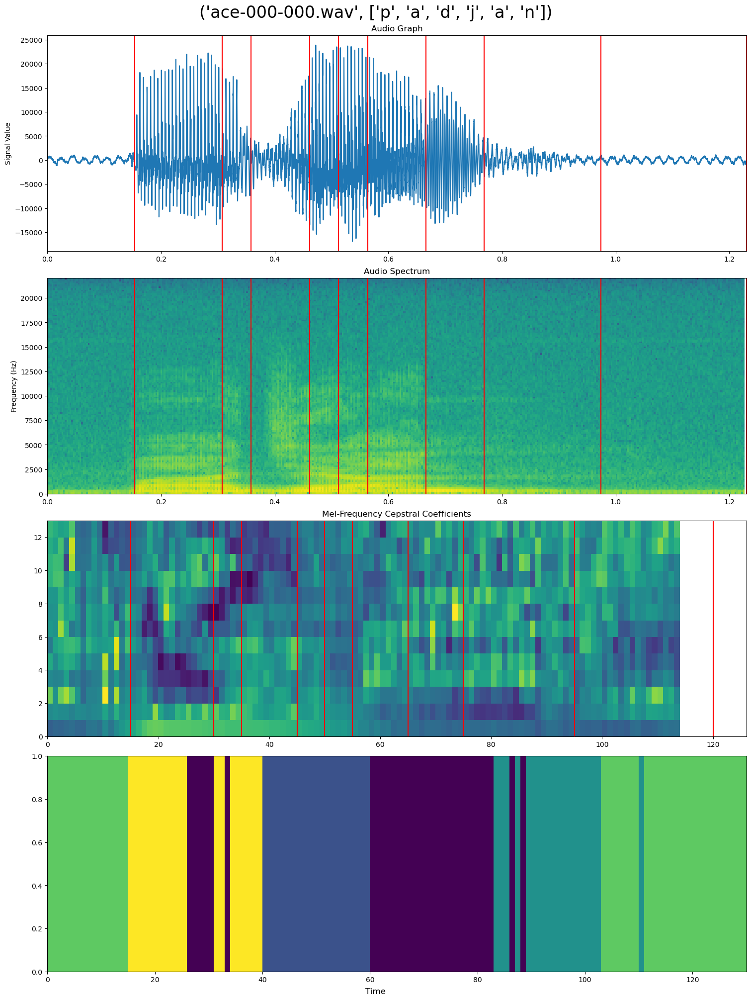

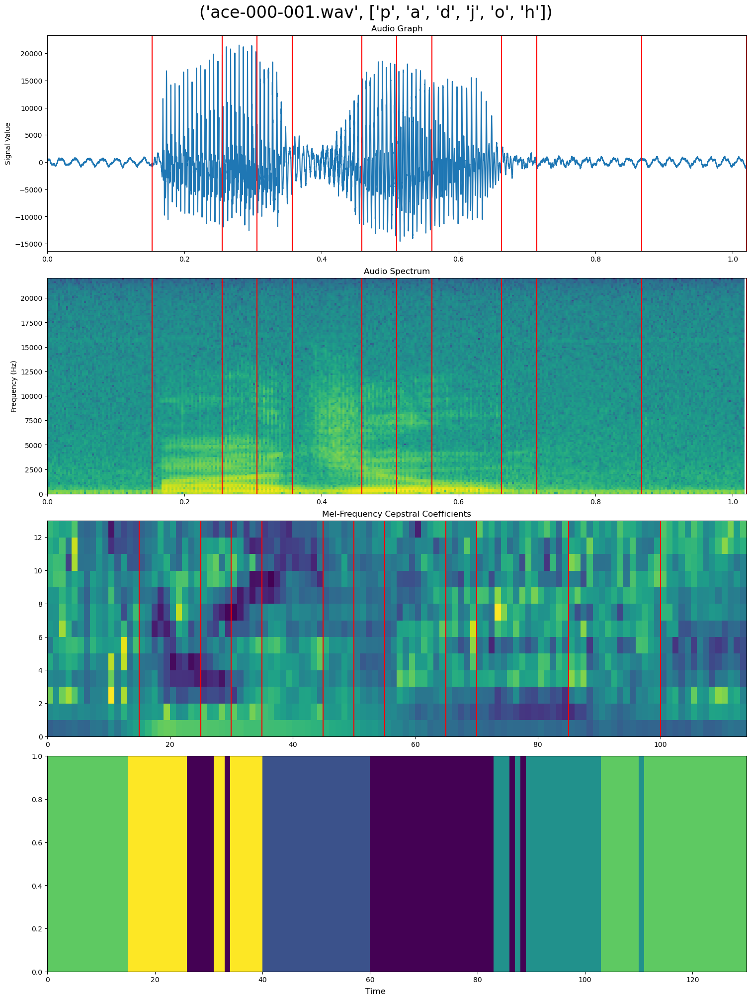

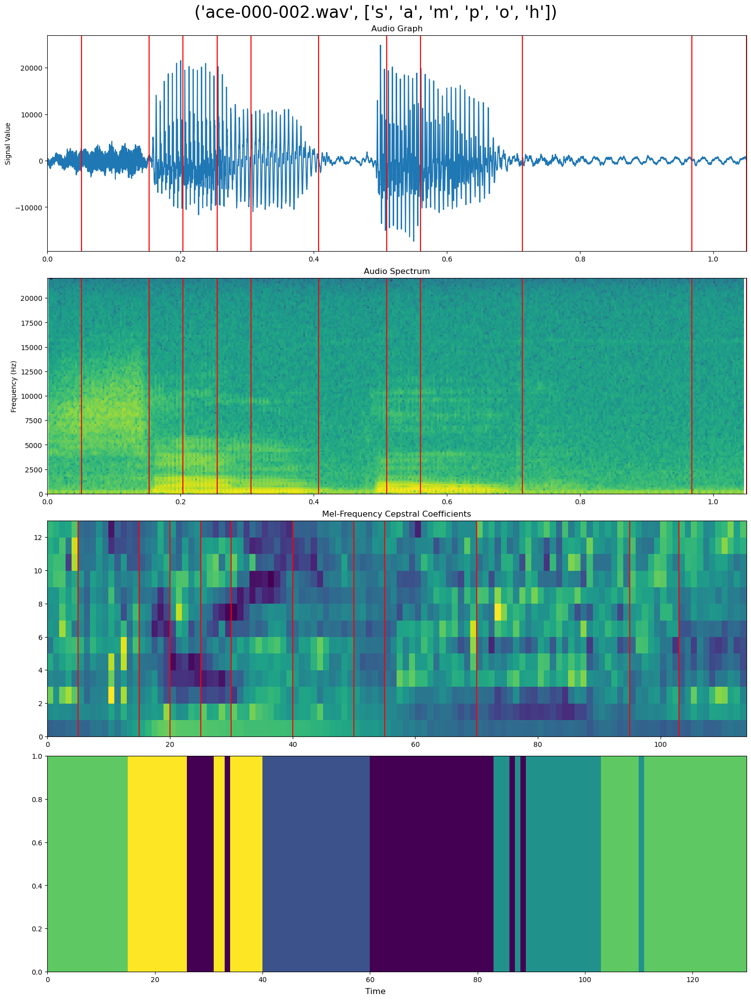

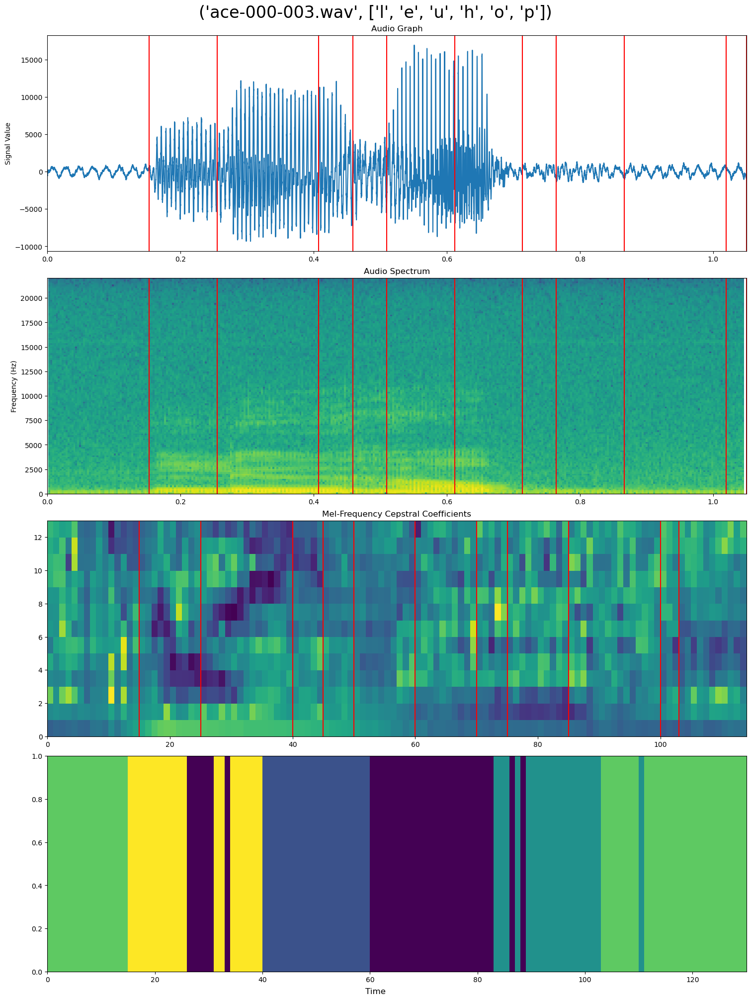

In [16]:
for sloan_sample in sloan_audio_list[:10]:
    audio_folder_path = os.path.join(audio_path, os.path.join(sloan_sample[0][:3], '.\\audio'))
    sample_audio_path = os.path.join(audio_folder_path, sloan_sample[0])
    fs, signal = wav.read(sample_audio_path)
    print(signal)
    print(sloan_sample[1])
    
    unique_ipa_list = list(set(sloan_sample[1]))
    
#     signal = signal[:,0]
    wav_obj = wave.open(sample_audio_path, 'rb')
    
    # Example of pre-emphasizing.
    signal_preemphasized = speechpy.processing.preemphasis(signal, cof=0.98)

    # Example of staching frames
    frames = speechpy.processing.stack_frames(signal, sampling_frequency=fs, frame_length=0.020, frame_stride=0.01, filter=lambda x: np.ones((x,)),
             zero_padding=True)

    # Example of extracting power spectrum
    power_spectrum = speechpy.processing.power_spectrum(frames, fft_points=512)
    print('power spectrum shape=', power_spectrum.shape)
    
    ############# Extract MFCC features #############
    mfcc = speechpy.feature.mfcc(signal, sampling_frequency=fs, frame_length=0.020, frame_stride=0.01,
                 num_filters=40, fft_length=512, low_frequency=0, high_frequency=None)
    mfcc_cmvn = speechpy.processing.cmvnw(mfcc,win_size=301,variance_normalization=True)
    print('mfcc(mean + variance normalized) feature shape=', mfcc_cmvn.shape)
    
    n_bkps = len(list(set(sloan_sample[1]))) + 4
    algo = rpt.Dynp(model='l2').fit(mfcc_cmvn)
    result = algo.predict(n_bkps=n_bkps)
    
    sample_freq = wav_obj.getframerate()
    n_samples = wav_obj.getnframes()
    print(n_samples, sample_freq)
    t_audio = n_samples/sample_freq
    n_channels = wav_obj.getnchannels()
    signal_wave = wav_obj.readframes(n_samples)
    
    signal_array = np.frombuffer(signal_wave, dtype=np.int16)
    # l_channel = signal_array[0::2]
    # r_channel = signal_array[1::2]
    l_channel = signal_array
    times = np.linspace(0, n_samples/sample_freq, num=n_samples)
    
    fig, ax = plt.subplots(nrows=4, ncols=1, constrained_layout=True)
    fig.supxlabel('Time')
    fig.set_size_inches(15, 20)
    
    fig.suptitle(str(sloan_sample), fontsize=24)
    ax[0].plot(times, l_channel)
    ax[0].set_title('Audio Graph')
    ax[0].set_ylabel('Signal Value')
#     ax[0].set_xlabel('Time (s)')
    ax[0].set_xlim(0, t_audio)
    for bk_line in result:
        ax[0].axvline(x=bk_line/len(mfcc_cmvn)*t_audio, color='red')
    
    ax[1].specgram(l_channel, Fs=sample_freq)
    ax[1].set_title('Audio Spectrum')
    ax[1].set_ylabel('Frequency (Hz)')
#     ax[1].set_xlabel('Time (s)')
    ax[1].set_xlim(0, t_audio)
#     plt.colorbar(fig,ax=ax[0])
    for bk_line in result:
        ax[1].axvline(x=bk_line/len(mfcc_cmvn)*t_audio, color='red')

#     plt.figure(figsize=(15, 5))
    ax[2].set_title('Mel-Frequency Cepstral Coefficients')
    ax[2].pcolor(whitened_mfcc_cmvn.T)
    for bk_line in result:
        ax[2].axvline(x=bk_line, color='red')
    
    ax[3].pcolor(np.array(classified_audio).T)

  0%|          | 0/10 [00:00<?, ?it/s]

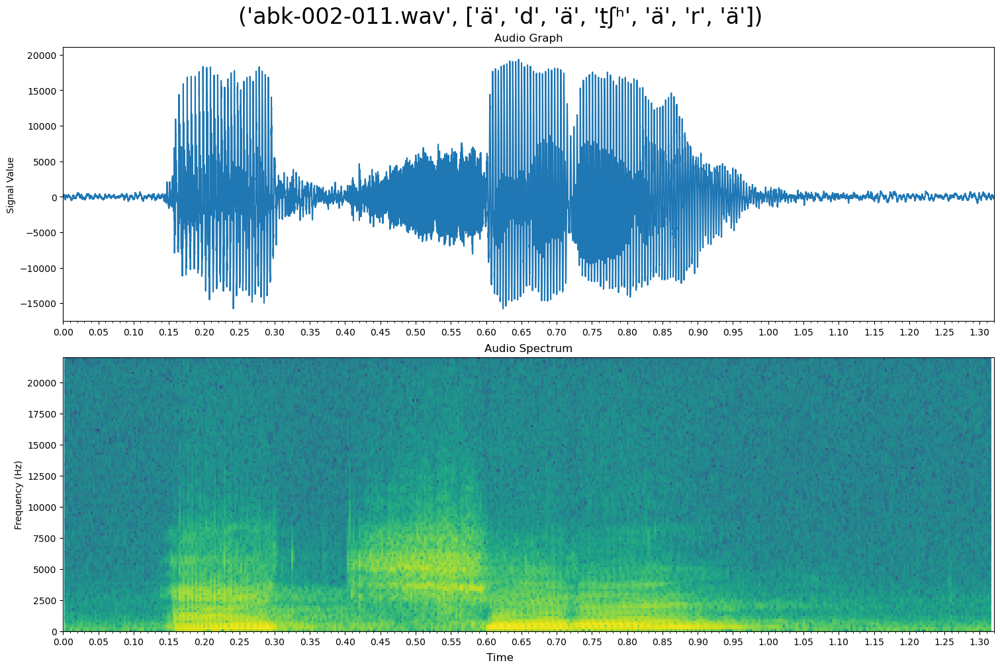

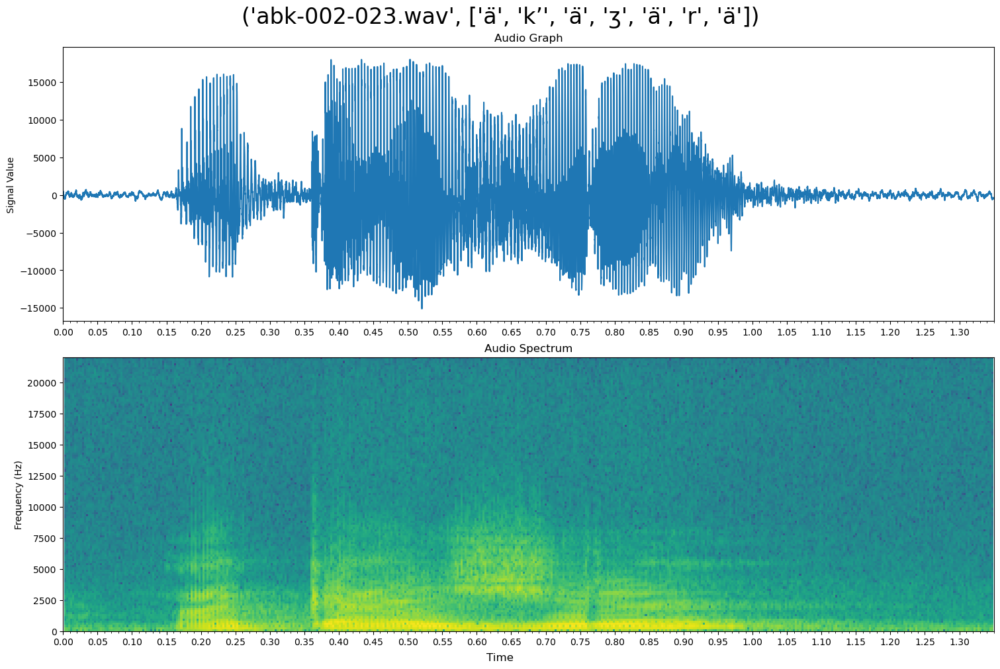

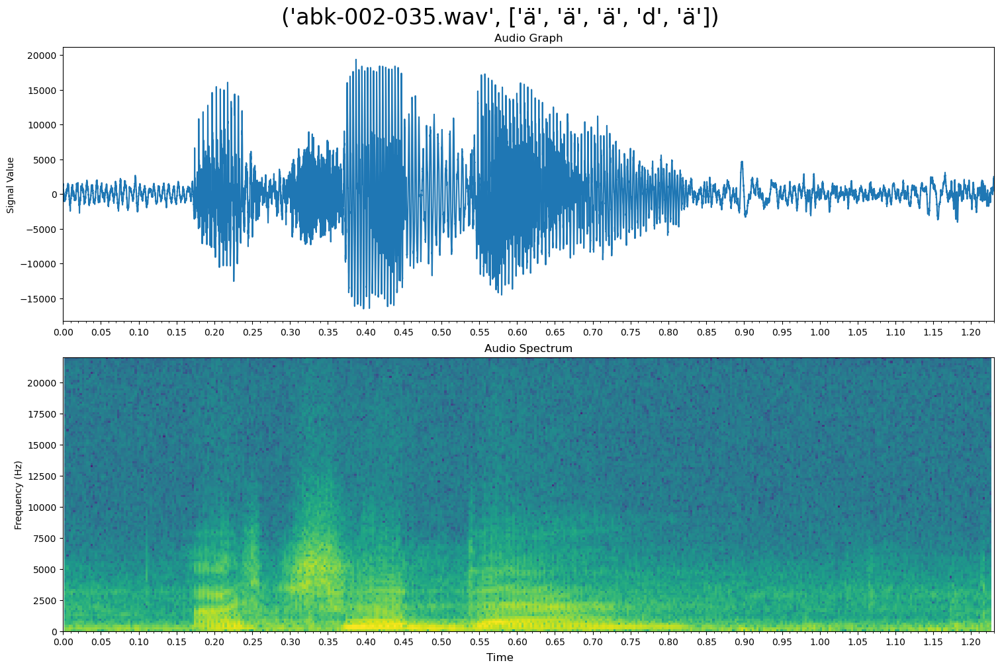

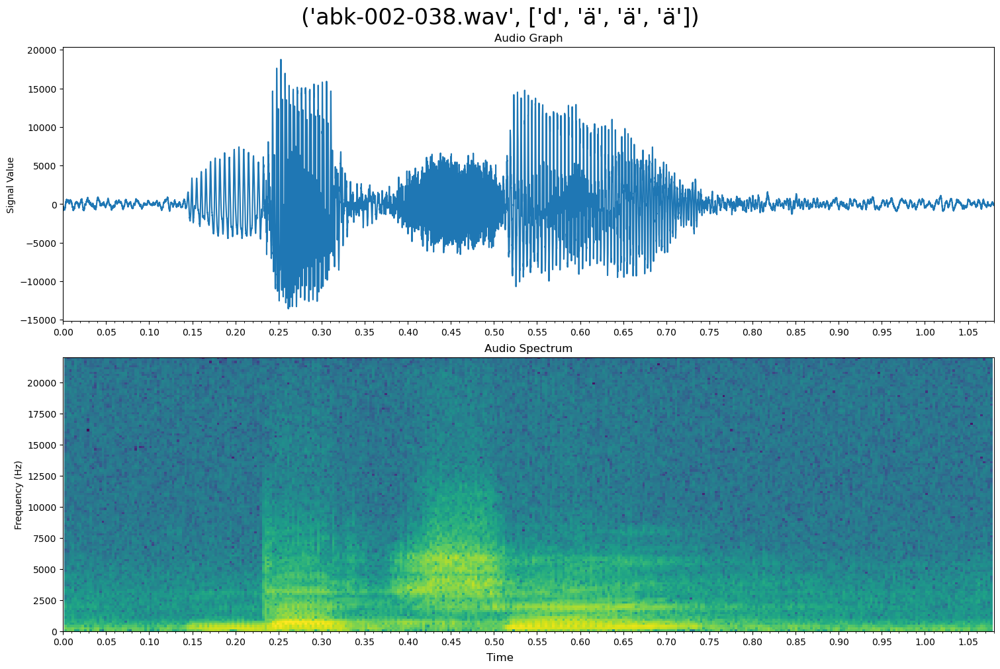

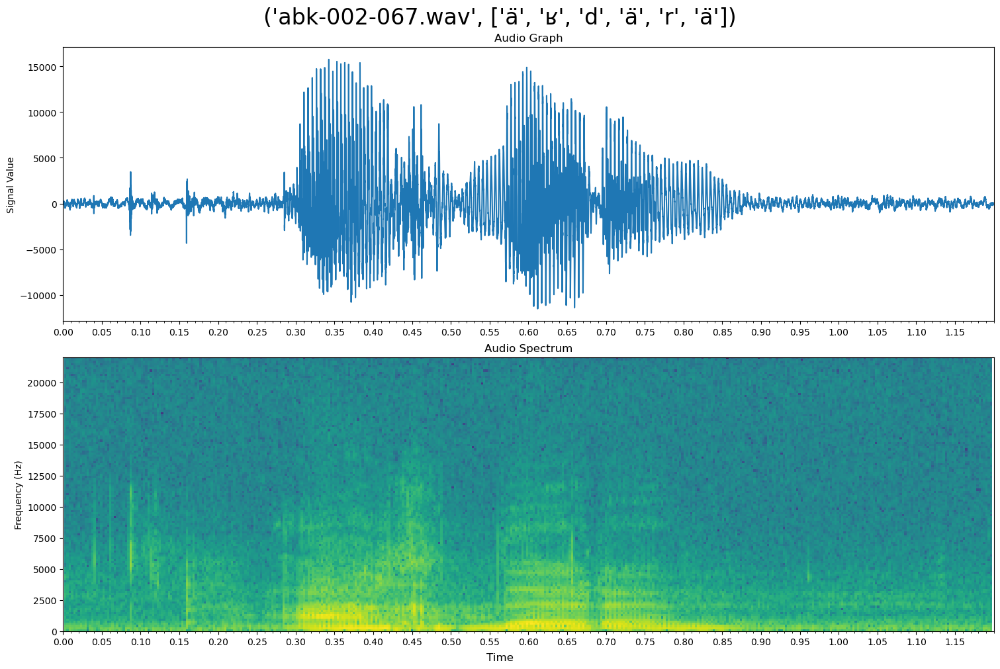

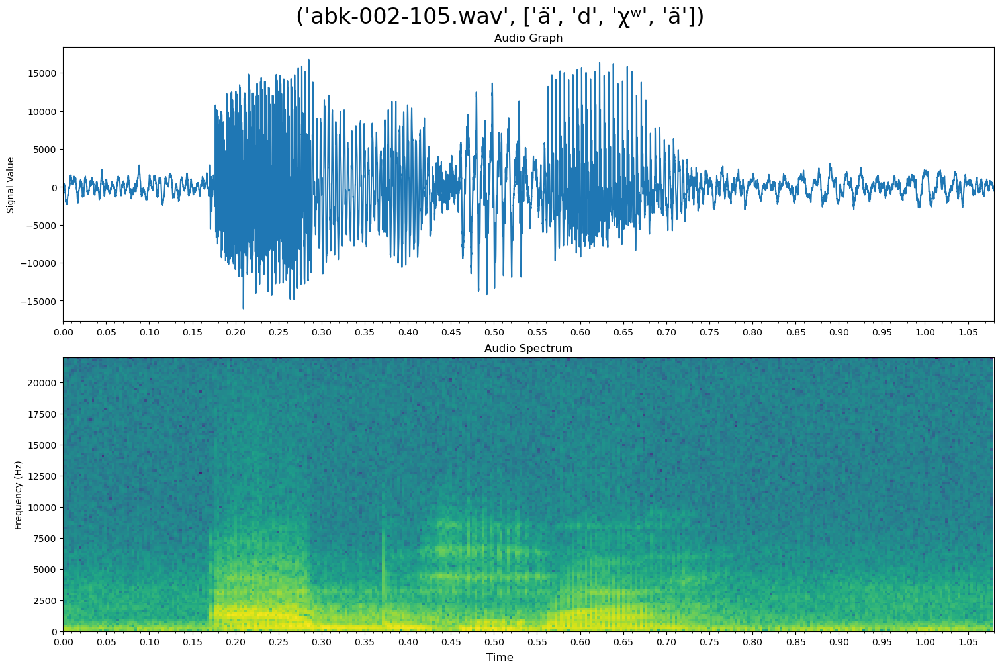

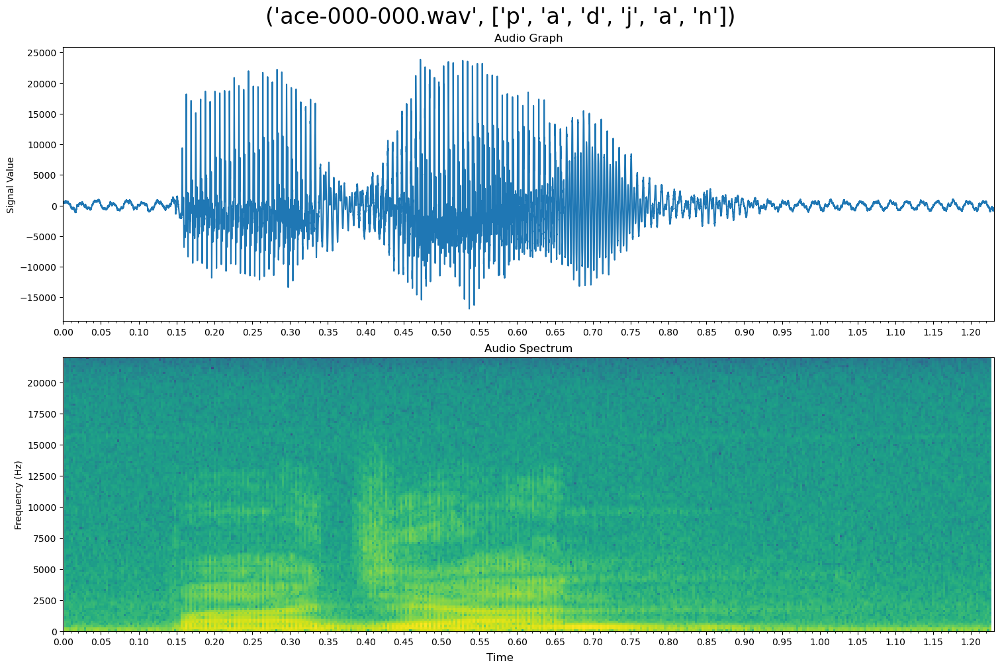

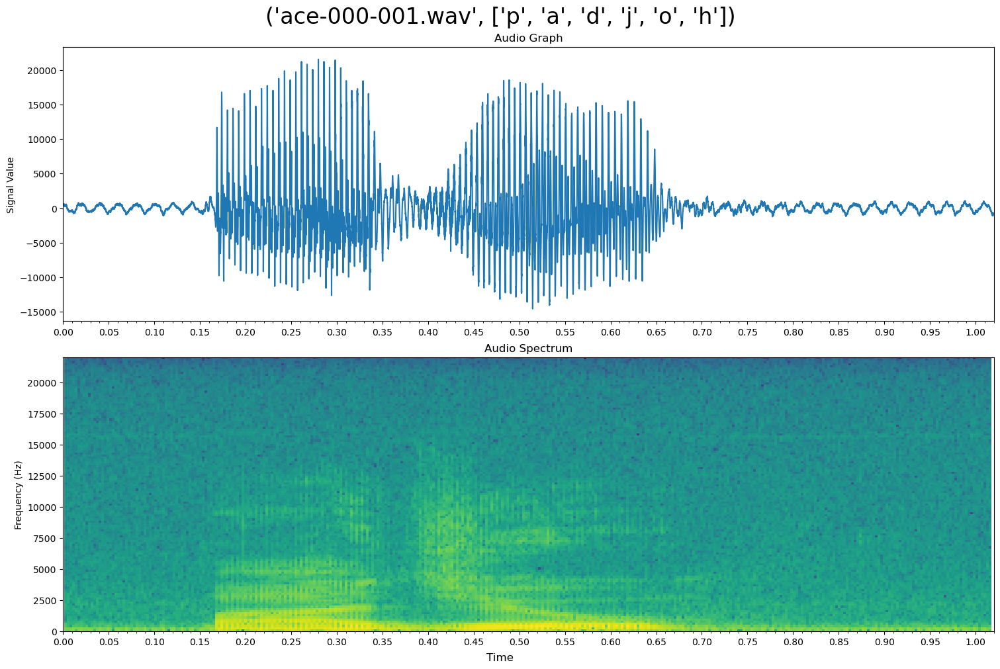

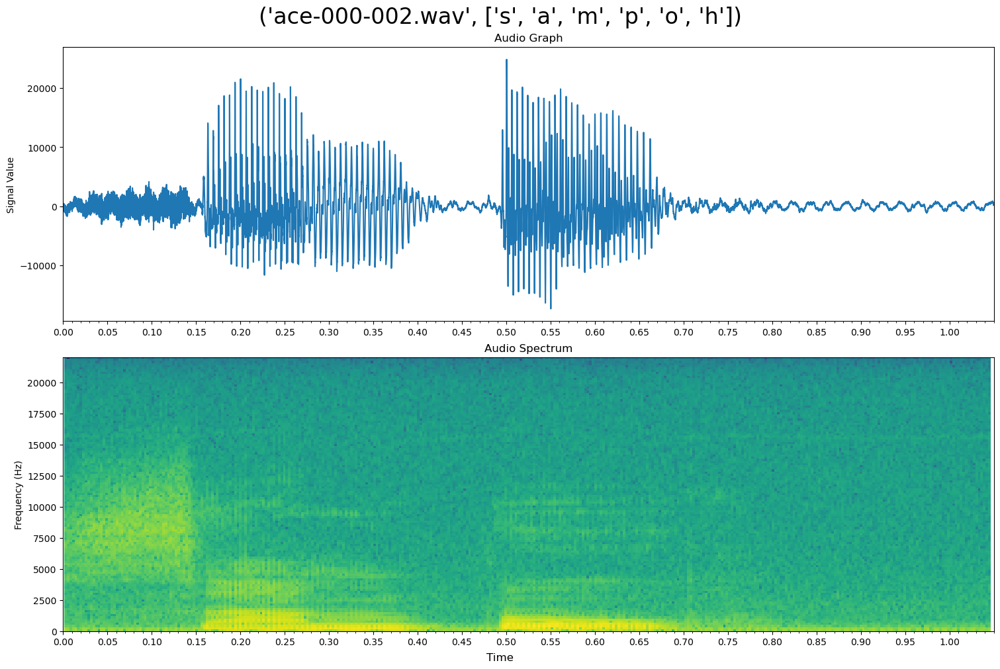

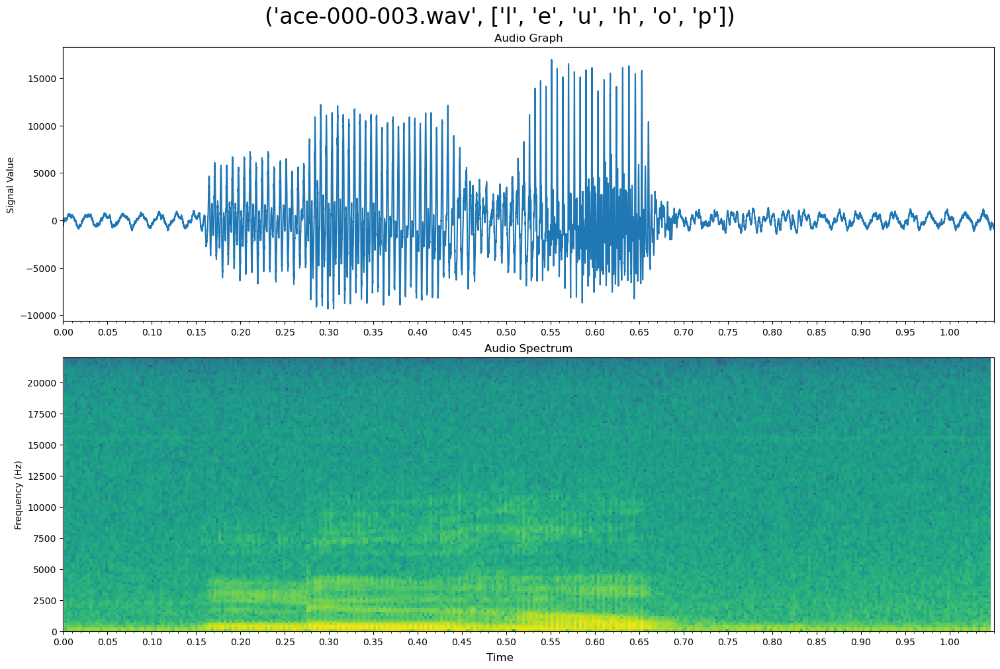

In [17]:
for sloan_sample in tqdm(sloan_audio_list[:10]):
    audio_folder_path = os.path.join(audio_path, os.path.join(sloan_sample[0][:3], '.\\audio'))
    sample_audio_path = os.path.join(audio_folder_path, sloan_sample[0])
    fs, signal = wav.read(sample_audio_path)
#     print(signal)
#     print(sloan_sample[1])
    
#     signal = signal[:,0]
    wav_obj = wave.open(sample_audio_path, 'rb')
    
    sample_freq = wav_obj.getframerate()
    n_samples = wav_obj.getnframes()
#     print(n_samples, sample_freq)
    t_audio = n_samples/sample_freq
    n_channels = wav_obj.getnchannels()
    signal_wave = wav_obj.readframes(n_samples)
    
    signal_array = np.frombuffer(signal_wave, dtype=np.int16)
    # l_channel = signal_array[0::2]
    # r_channel = signal_array[1::2]
    l_channel = signal_array
    times = np.linspace(0, n_samples/sample_freq, num=n_samples)
    
    fig, ax = plt.subplots(nrows=2, ncols=1, constrained_layout=True)
    fig.supxlabel('Time')
    fig.set_size_inches(15, 10)
    
    fig.suptitle(str(sloan_sample), fontsize=24)
    ax[0].plot(times, l_channel)
    ax[0].set_title('Audio Graph')
    ax[0].set_ylabel('Signal Value')
    ax[0].set_xlim(0, t_audio)
    ax[0].xaxis.set_ticks(np.arange(0, t_audio, 0.05))
    ax[0].xaxis.set_minor_locator(MultipleLocator(0.01))
    
    ax[1].specgram(l_channel, Fs=sample_freq)
    ax[1].set_title('Audio Spectrum')
    ax[1].set_ylabel('Frequency (Hz)')
    ax[1].xaxis.set_ticks(np.arange(0, t_audio, 0.05))
    ax[1].xaxis.set_minor_locator(MultipleLocator(0.01))
#     ax[1].set_xlabel('Time (s)')
    ax[1].set_xlim(0, t_audio)
#     plt.colorbar(fig,ax=ax[0])


# Import using TIMIT Dataset

## FFT Version

In [39]:
testing_dir = os.getcwd()
testing_dir = os.path.join(testing_dir, '.\\TIMIT\\TEST')

training_dir = os.getcwd()
training_dir = os.path.join(training_dir, '.\\TIMIT\\TRAIN')



def load_phoneme_dataset(working_dir):
    phoneme_signals = {}
    dialect_folders = os.listdir(working_dir)
    for dialect_folder in tqdm(dialect_folders, leave=False):
        voice_folders = os.listdir(os.path.join(working_dir, dialect_folder))
        for voice_sample_folder in tqdm(voice_folders, leave=False):
            current_dir = os.path.join(working_dir, dialect_folder)
            current_dir = os.path.join(current_dir, voice_sample_folder)

            voice_samples = [file for file in os.listdir(current_dir) if file.endswith('.WAV')]
            for voice_sample in tqdm(voice_samples):
                voice_sample_path = os.path.join(current_dir, voice_sample)
                signal, fs = sf.read(voice_sample_path)
#                 signal = np.zeros_like(signal)
#                 signal[40000] = 10
#                 print(signal.shape)
    
                # Pre-emphasize signal
                signal_preemphasized = speechpy.processing.preemphasis(signal, cof=0.98)

                # FFT
                frames = speechpy.processing.stack_frames(signal_preemphasized, sampling_frequency=fs, frame_length=0.02, frame_stride=0.01, zero_padding=True)
                fft = speechpy.processing.fft_spectrum(frames, 256)
    
#                 fig, ax = plt.subplots(nrows=2, ncols=1, constrained_layout=True)
#                 fig.supxlabel('Time')
#                 fig.set_size_inches(15, 10)
#                 ax[0].plot(signal_preemphasized)
#                 ax[0].set_xlim(0, signal_preemphasized.shape[0])
                
#                 fig.colorbar(ax[1].pcolor(fft.T))
                

                phoneme_transcript_path = os.path.join(current_dir, voice_sample)[:-3] + 'PHN'
                f = open(phoneme_transcript_path, encoding='utf-8')
                lines = f.readlines()
                for line in lines:
                    data = line.split(' ')
                    phoneme_start_idx = int(data[0])
                    phoneme_stop_idx = int(data[1])
                    phoneme = data[2].strip()
                    
#                     ax[0].axvline(x=phoneme_start_idx, color='red')
#                     ax[1].axvline(x=phoneme_start_idx/160, color='red')
                    
                    phoneme_fft = fft[int(phoneme_start_idx/160):int(phoneme_stop_idx/160)]

                
                    if phoneme in phoneme_signals:
#                         print(phoneme_fft)
                        phoneme_signals[phoneme] = np.concatenate((phoneme_signals[phoneme], phoneme_fft), axis=0)
                        
                    else:
                        phoneme_signals[phoneme] = phoneme_fft
    return phoneme_signals
        
training_phoneme_signals = load_phoneme_dataset(training_dir)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

[ 2.69775391e-04 -6.04248047e-05  9.09423828e-05 ... -1.50146484e-04
 -1.22680664e-04 -9.46044922e-05]


AssertionError: Signal dimention should be of the format of (N,) but it is (46797, 1) instead

## MFCC Version

In [1]:
testing_dir = os.getcwd()
testing_dir = os.path.join(testing_dir, '.\\TIMIT\\TEST')

training_dir = os.getcwd()
training_dir = os.path.join(training_dir, '.\\TIMIT\\TRAIN')



def load_phoneme_dataset(working_dir):
    phoneme_signals = {}
    dialect_folders = os.listdir(working_dir)
    for dialect_folder in tqdm(dialect_folders, leave=False):
        voice_folders = os.listdir(os.path.join(working_dir, dialect_folder))
        for voice_sample_folder in tqdm(voice_folders, leave=False):
            current_dir = os.path.join(working_dir, dialect_folder)
            current_dir = os.path.join(current_dir, voice_sample_folder)

            voice_samples = [file for file in os.listdir(current_dir) if file.endswith('.WAV')]
            for voice_sample in tqdm(voice_samples):
                voice_sample_path = os.path.join(current_dir, voice_sample)
                signal, fs = sf.read(voice_sample_path)
#                 signal = np.zeros_like(signal)
#                 signal[40000] = 10
#                 print(signal.shape)
    
                # Pre-emphasize signal
#                 signal_preemphasized = speechpy.processing.preemphasis(signal, cof=0.98)

#                 # Extract MFCC features
#                 mfcc = speechpy.feature.mfcc(signal_preemphasized, fs, num_cepstral=13)

#                 # Apply cepstral mean and variance normalization
#                 mfcc_cmvn = speechpy.processing.cmvn(mfcc, variance_normalization=True)
    
#                 fig, ax = plt.subplots(nrows=4, ncols=1, constrained_layout=True)
#                 fig.supxlabel('Time')
#                 fig.set_size_inches(15, 20)
                
#                 ax[0].plot(signal)
#                 ax[0].set_xlim(0, signal.shape[0])
#                 ax[1].plot(signal_preemphasized)
#                 ax[1].set_xlim(0, signal_preemphasized.shape[0])
                
#                 fig.colorbar(ax[2].pcolor(mfcc.T))
#                 fig.colorbar(ax[3].pcolor(mfcc_cmvn.T))
                

                phoneme_transcript_path = os.path.join(current_dir, voice_sample)[:-3] + 'PHN'
                f = open(phoneme_transcript_path, encoding='utf-8')
                lines = f.readlines()
                for line in lines:
                    data = line.split(' ')
                    phoneme_start_idx = int(data[0])
                    phoneme_stop_idx = int(data[1])
                    phoneme = data[2].strip()
                    
#                     ax[0].axvline(x=phoneme_start_idx, color='red')
#                     ax[1].axvline(x=phoneme_start_idx, color='red')
#                     ax[2].axvline(x=phoneme_start_idx/160, color='red')
#                     ax[3].axvline(x=phoneme_start_idx/160, color='red')
                    
                    new_signal = signal[int(phoneme_start_idx):int(phoneme_stop_idx)]

                
                    if phoneme in phoneme_signals:
#                         print(phoneme_fft)
                        phoneme_signals[phoneme] = np.concatenate((phoneme_signals[phoneme], new_signal), axis=0)
                        
                    else:
                        phoneme_signals[phoneme] = new_signal
    return phoneme_signals
        

raw_training_phoneme_signals = load_phoneme_dataset(training_dir)

NameError: name 'os' is not defined

# 

In [231]:
with open('timit_training_phoneme_raw_dict.pkl', 'wb') as f:
    pickle.dump(raw_training_phoneme_signals, f)

In [2]:
with open(r"timit_training_phoneme_mfcc_dict.pkl", "rb") as f:
    training_phoneme_signals = pickle.load(f)

In [3]:
print(training_phoneme_signals.keys())

dict_keys(['h#', 'sh', 'ix', 'hv', 'eh', 'dcl', 'jh', 'ih', 'd', 'ah', 'kcl', 'k', 's', 'ux', 'q', 'en', 'gcl', 'g', 'r', 'w', 'ao', 'epi', 'dx', 'axr', 'l', 'y', 'uh', 'n', 'ae', 'm', 'oy', 'ax', 'dh', 'tcl', 'iy', 'v', 'f', 't', 'pcl', 'ow', 'hh', 'ch', 'bcl', 'b', 'aa', 'em', 'ng', 'ay', 'th', 'ax-h', 'ey', 'p', 'aw', 'er', 'nx', 'z', 'el', 'uw', 'pau', 'zh', 'eng'])


In [4]:
# for label in training_phoneme_signals.keys():
#     fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True)
#     fig.supxlabel('Time')
#     fig.set_size_inches(15, 5)

# #     print(training_phoneme_signals['b'].shape)
#     ax.pcolor(training_phoneme_signals[label][:1000].T)
#     ax.set_title(label)
# #     ax[1].pcolor(training_phoneme_signals['bcl'][:1000].T)

# Convert phonemes for easier recognition

In [5]:
new_phenome_lookup = {
    'iy':'i',
    'ih':'i',
    's':'s',
    'd':'d',
    'eh':'e',
    'ey':'e',
    'ch':'ch',
    'hh':'h',
    'k':'k',
    'ow':'o',
    'ae':'a',
    'aa':'a',
    'ah':'a',
    'ao':'a',
    'oy':'a',
    'er':'r',
    'v':'v',
    'w':'v',
    'z':'z'
}



In [6]:
print(training_phoneme_signals)

{'h#': array([[-2.59563349, -0.53759172, -0.05478949, ..., -1.31652511,
        -1.2129898 ,  0.20704386],
       [-2.55328924, -0.73009447,  0.02501781, ..., -1.38752507,
        -1.47029478, -0.00551204],
       [-2.52668026, -0.99445639, -0.12906407, ..., -1.20836191,
        -1.78692123,  0.14757132],
       ...,
       [-1.48807322, -0.13396187, -1.23539497, ..., -0.41720968,
        -1.10514032, -0.53377519],
       [-1.50032122, -0.17853296, -1.39609482, ..., -0.06710354,
        -0.59130034, -0.93354122],
       [-1.48841099,  0.11506061, -1.30202214, ...,  0.7051756 ,
        -0.18732025, -1.5888878 ]]), 'sh': array([[ 0.14697046, -1.50951999,  0.28483303, ..., -0.68986682,
         0.0646261 , -1.27286701],
       [ 0.61447071, -1.84673419,  0.42352599, ...,  0.64319174,
         0.50436603, -1.1707689 ],
       [ 1.01872675, -0.87961852,  1.00414171, ...,  0.09828563,
         0.0988793 , -0.15506032],
       ...,
       [ 0.96544555, -1.56421207,  1.38180867, ...,  0.389620

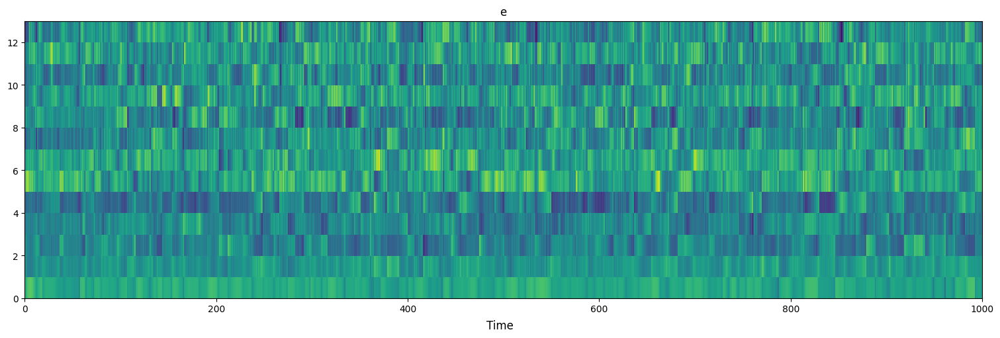

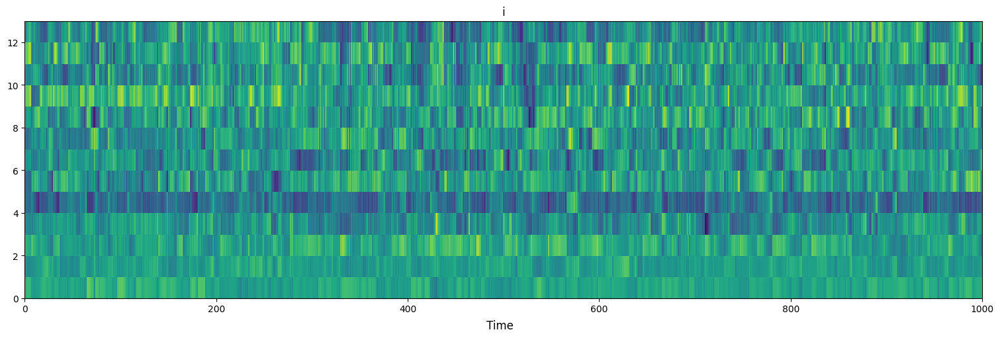

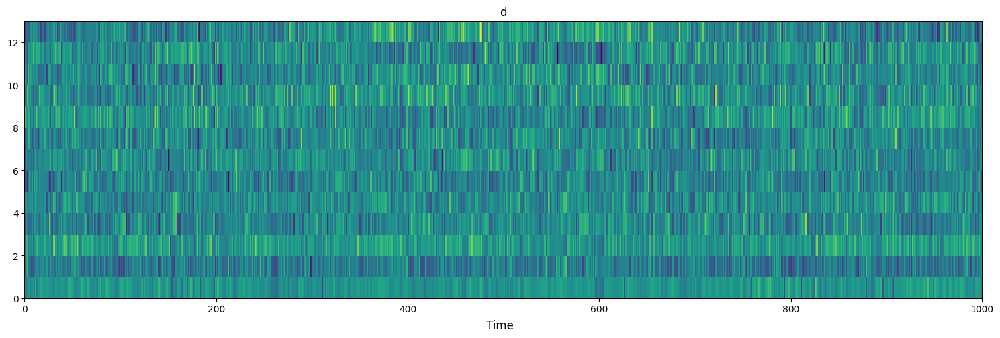

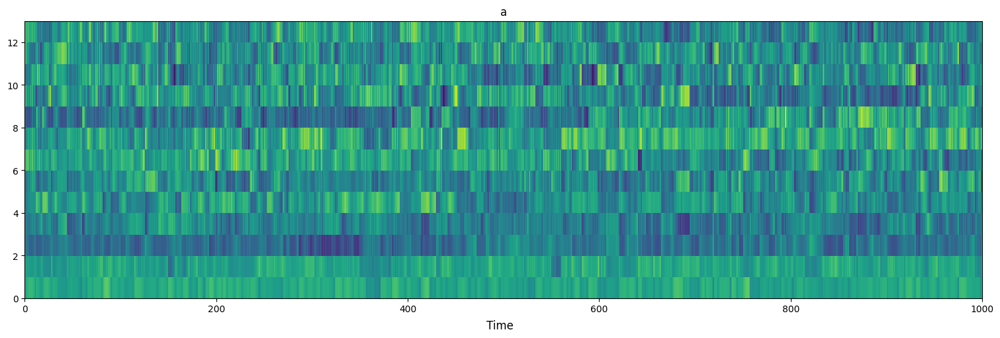

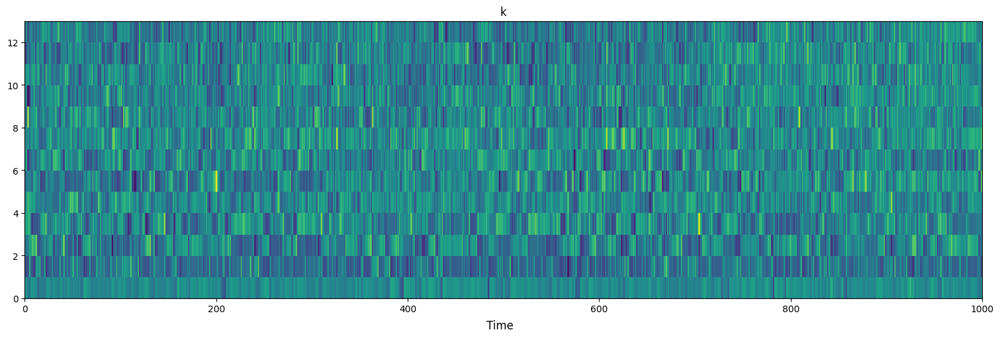

...

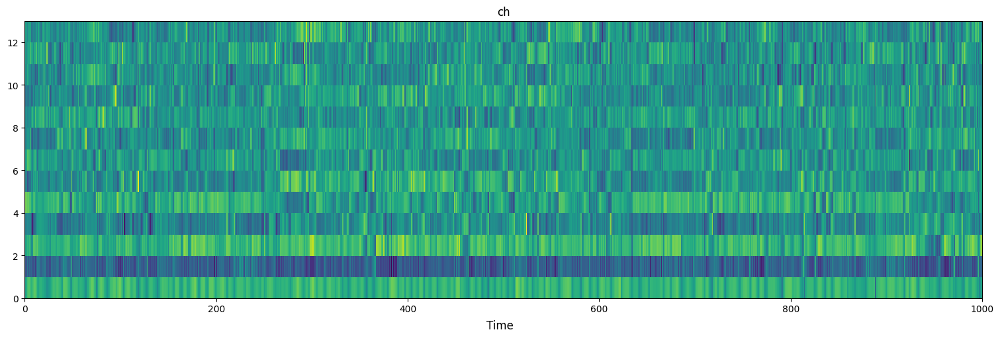

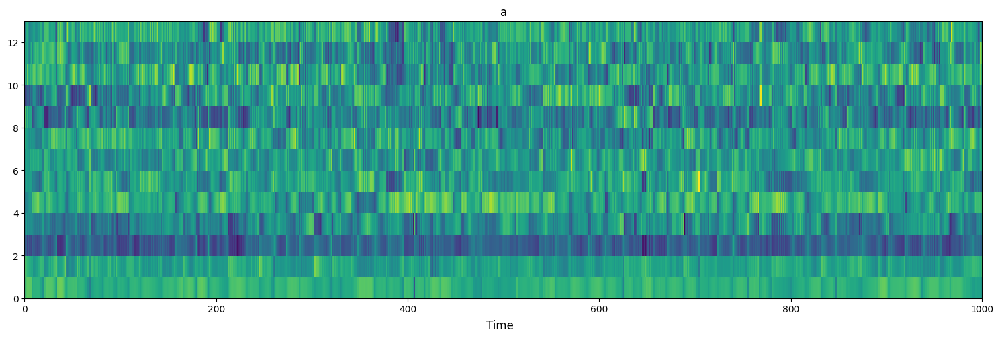

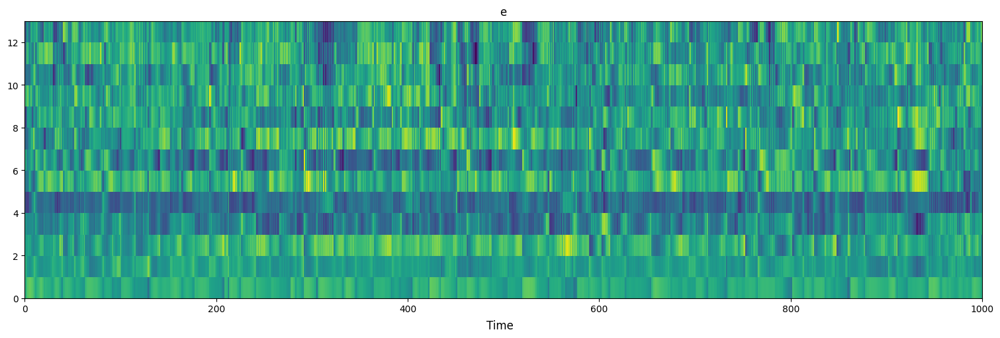

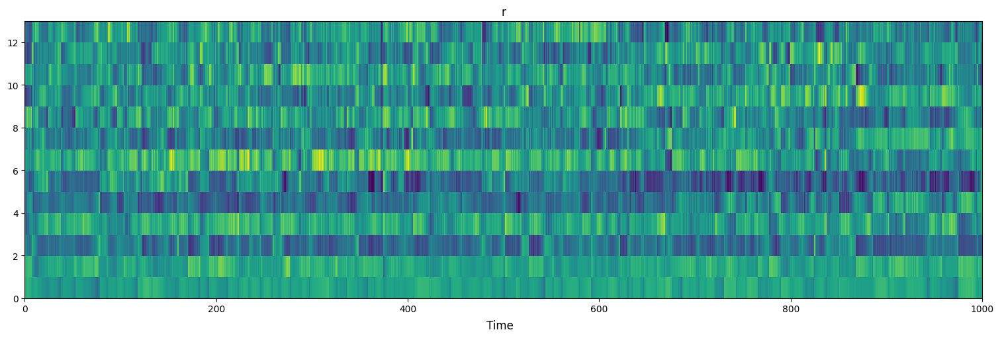

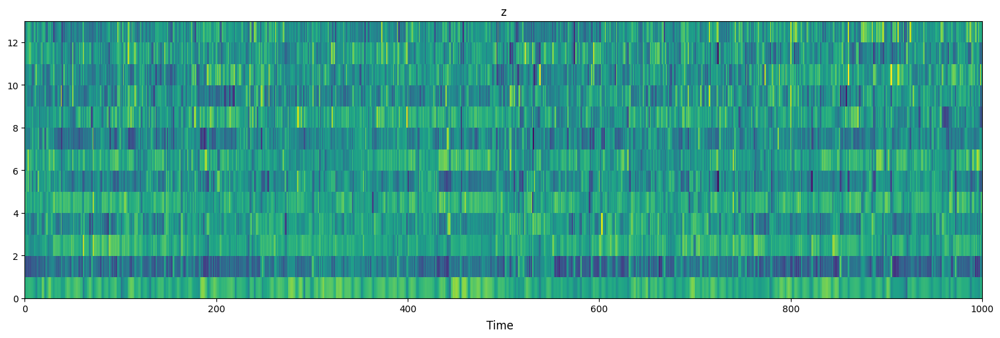

In [7]:
training_y = []
training_x = []
for phoneme in training_phoneme_signals:
    if phoneme in new_phenome_lookup:
        sample_disp = []
#         print(new_phenome_lookup[phoneme], training_phoneme_signals[phoneme])
        for i, sample in enumerate(training_phoneme_signals[phoneme]):
            training_y.append(new_phenome_lookup[phoneme])
            training_x.append(np.array(sample))
            if i < 1000:
                sample_disp.append(np.array(sample))
            
        sample_disp = np.asarray(sample_disp)
        fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True)
        fig.supxlabel('Time')
        fig.set_size_inches(15, 5)

        ax.pcolor(sample_disp.T)
        ax.set_title(new_phenome_lookup[phoneme])
        

## Sliding Window MFCC

In [8]:
training_y = []
training_x = []
for phoneme in tqdm(training_phoneme_signals):
    if phoneme in new_phenome_lookup:
        sample_disp = []
#         print(new_phenome_lookup[phoneme], training_phoneme_signals[phoneme])
        tmp = []
        for i, sample in enumerate(training_phoneme_signals[phoneme]):
            tmp.append(np.array(sample))

            if (i + 1) % 3 == 0:
                training_x.append(np.asarray(tmp))
                tmp = []
                training_y.append(new_phenome_lookup[phoneme])
            if len(training_phoneme_signals[phoneme]) - i < 3:
                break
#             print(tmp)
#             if i < 1000:
#                 sample_disp.append(np.array(sample))
            
#         sample_disp = np.asarray(sample_disp)
#         fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True)
#         fig.supxlabel('Time')
#         fig.set_size_inches(15, 5)

#         ax.pcolor(sample_disp.T)
#         ax.set_title(new_phenome_lookup[phoneme])
training_x = np.asarray(training_x)
training_y = np.asarray(training_y)

  0%|          | 0/61 [00:00<?, ?it/s]

In [9]:
print(training_y.shape)
print(training_x.shape)

(192503,)
(192503, 3, 13)


In [11]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, Conv2D, MaxPooling2D, GlobalAveragePooling2D, BatchNormalization
from sklearn.preprocessing import LabelEncoder
import numpy as np
from tensorflow.keras.callbacks import TensorBoard

tensorboard_callback = TensorBoard(log_dir="./logs/v7")

data = np.asarray(training_x)  # shape (577547, 129)
labels = np.asarray(training_y)  # shape (577547,)

# Convert labels to one-hot encoding

encoder = LabelEncoder()
labels_num = encoder.fit_transform(labels)

labels_onehot = tf.keras.utils.to_categorical(labels_num)

print(data.shape)

# Define the input shape of the data
input_shape = (data.shape[1], data.shape[2], 1)

# Add padding to the input data
# data_padded = np.pad(data, ((0,0),(1,1)), mode='constant')

# Define the model architecture
model = Sequential()
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same', input_shape=input_shape))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(GlobalAveragePooling2D())
model.add(Dense(units=256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=32, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=12, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

model.fit(data, labels_onehot, epochs=10, batch_size=128, callbacks=[tensorboard_callback])

(192503, 3, 13)
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 3, 13, 64)         640       
                                                                 
 batch_normalization_1 (Batc  (None, 3, 13, 64)        256       
 hNormalization)                                                 
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 1, 6, 64)         0         
 2D)                                                             
                                                                 
 global_average_pooling2d_1   (None, 64)               0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_6 (Dense)             (None, 256)               16640     
                                      

KeyboardInterrupt: 

In [68]:
model.save('mfcc_256.h5')

In [79]:
print(data)
mfcc_256_mean = np.mean(data, axis=0)
mfcc_256_std = np.std(data, axis=0)

np.save('mfcc_256_mean.npy', mfcc_256_mean)
np.save('mfcc_256_std.npy', mfcc_256_std)

[[ 0.64808836  0.0492193   0.09718838 ... -2.23487617 -0.80200901
  -3.02644969]
 [ 1.00598986  0.0911701  -0.11447773 ... -0.92393105 -0.49306148
  -2.51999927]
 [ 1.33603965 -0.12544243 -0.13663612 ... -1.47203752 -0.61940619
  -1.53527241]
 ...
 [ 0.97065313 -1.08065874  1.51521502 ...  0.65712791 -0.02577104
   0.89045205]
 [ 0.78274309 -1.6479946   0.84721746 ...  0.10776784 -0.79916376
  -0.44565963]
 [ 0.29647305  0.12939813  1.0407612  ...  0.50175945  1.12399774
   0.51748547]]


In [86]:
label_dict = {}
# print(labels_num, training_y)
for i, label_name in enumerate(training_y):
    label_dict[labels_num[i]] = training_y[i]

In [87]:
print(label_dict)

{3: 'e', 5: 'i', 2: 'd', 0: 'a', 6: 'k', 9: 's', 10: 'v', 7: 'o', 4: 'h', 1: 'ch', 8: 'r', 11: 'z'}


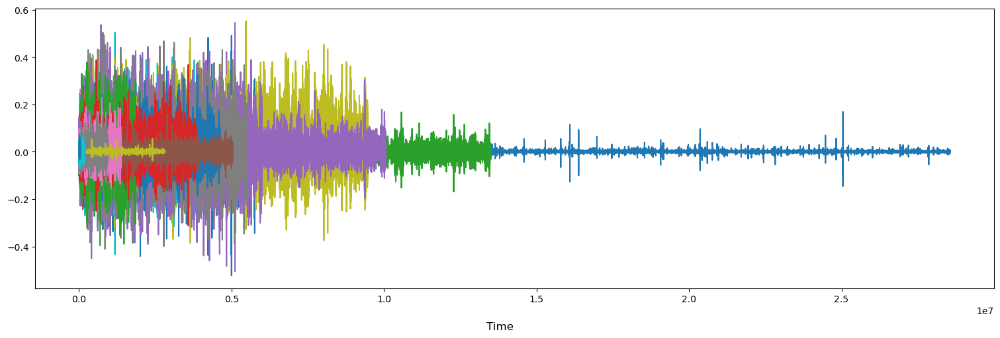

In [234]:
import librosa

fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True)
fig.supxlabel('Time')
fig.set_size_inches(15, 5)

for label in raw_training_phoneme_signals:
    new_audio = raw_training_phoneme_signals[label]
    ax.plot(new_audio)
    sf.write(f"./test/{label}.wav", new_audio, 16000)

In [1]:
import tensorflow as tf
from tensorflow import keras
import scipy
import scipy.io.wavfile as wav
import numpy as np
import wave
import matplotlib.pyplot as plt
import noisereduce
import speechpy
import os
from scipy.cluster.vq import vq, kmeans2, kmeans, whiten
from scipy.spatial import distance
from tqdm.notebook import tqdm
from hmmlearn import hmm
import ruptures as rpt
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import soundfile as sf
import sounddevice as sd
import pickle 

C:\Users\user\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


## Raw Phoneme Dataset

In [ ]:
testing_dir = os.getcwd()
testing_dir = os.path.join(testing_dir, '.\\TIMIT\\TEST')

training_dir = os.getcwd()
training_dir = os.path.join(training_dir, '.\\TIMIT\\TRAIN')



def load_phoneme_dataset(working_dir):
    phoneme_signals = {}
    dialect_folders = os.listdir(working_dir)
    for dialect_folder in tqdm(dialect_folders, leave=False):
        voice_folders = os.listdir(os.path.join(working_dir, dialect_folder))
        for voice_sample_folder in tqdm(voice_folders, leave=False):
            current_dir = os.path.join(working_dir, dialect_folder)
            current_dir = os.path.join(current_dir, voice_sample_folder)

            voice_samples = [file for file in os.listdir(current_dir) if file.endswith('.WAV')]
            for voice_sample in tqdm(voice_samples):
                voice_sample_path = os.path.join(current_dir, voice_sample)
                signal, fs = sf.read(voice_sample_path)
#                 signal = np.zeros_like(signal)
#                 signal[40000] = 10
#                 print(signal.shape)
    
                # Pre-emphasize signal
                signal_preemphasized = speechpy.processing.preemphasis(signal, cof=0.98)

                # FFT
                frames = speechpy.processing.stack_frames(signal_preemphasized, sampling_frequency=fs, frame_length=0.02, frame_stride=0.01, zero_padding=True)
                fft = speechpy.processing.fft_spectrum(frames, 256)
    
#                 fig, ax = plt.subplots(nrows=2, ncols=1, constrained_layout=True)
#                 fig.supxlabel('Time')
#                 fig.set_size_inches(15, 10)
#                 ax[0].plot(signal_preemphasized)
#                 ax[0].set_xlim(0, signal_preemphasized.shape[0])
                
#                 fig.colorbar(ax[1].pcolor(fft.T))
                

                phoneme_transcript_path = os.path.join(current_dir, voice_sample)[:-3] + 'PHN'
                f = open(phoneme_transcript_path, encoding='utf-8')
                lines = f.readlines()
                for line in lines:
                    data = line.split(' ')
                    phoneme_start_idx = int(data[0])
                    phoneme_stop_idx = int(data[1])
                    phoneme = data[2].strip()
                    
#                     ax[0].axvline(x=phoneme_start_idx, color='red')
#                     ax[1].axvline(x=phoneme_start_idx/160, color='red')
                    
                    phoneme_fft = fft[int(phoneme_start_idx/160):int(phoneme_stop_idx/160)]

                
                    if phoneme in phoneme_signals:
#                         print(phoneme_fft)
                        phoneme_signals[phoneme] = np.concatenate((phoneme_signals[phoneme], phoneme_fft), axis=0)
                        
                    else:
                        phoneme_signals[phoneme] = phoneme_fft
    return phoneme_signals
        
training_phoneme_signals = load_phoneme_dataset(training_dir)